# Introduction:

Exploratory Data Analysis (EDA) serves as a foundational pillar in the development of an insightful and effective dashboard. As an essential preliminary step in data analysis, EDA is instrumental in unraveling the intricate details of a dataset, employing a combination of visualization and statistical methods. The overarching goal of this Exploratory Data Report is to provide a systematic guide for conducting EDA, emphasizing its crucial role in informing the subsequent creation of a dashboard.

Within this report, we embark on a comprehensive journey through the various stages of EDA, each step contributing to a holistic understanding of the dataset. By scrutinizing data characteristics, addressing missing values, cleaning categorical variables, and employing diverse visualizations, we aim to extract valuable insights that will form the basis for informed decision-making during the dashboard creation process.

This guide unfolds with an introduction to the dataset, clearly articulating the objectives and goals of both the EDA and the envisioned dashboard. We then delve into the intricacies of data examination, elucidating basic information and descriptive statistics. The subsequent sections strategically navigate through the realms of data cleanliness, demographic analysis, correlation exploration, and insightful findings, all of which play pivotal roles in shaping the narrative of the dashboard.

By adhering to this systematic approach and documenting the entire EDA process, we aim to empower data practitioners, analysts, and dashboard creators with the tools and insights necessary to unlock the full potential of their datasets. Ultimately, this Exploratory Data Report serves as a compass, guiding stakeholders towards a data-driven and purposeful journey in the realm of dashboard development.

# About the data set:


In the pursuit of developing a robust and insightful dashboard, our exploration is centered around the Opportunity Sign-Up and Completion Data. The dataset under examination is meticulously curated to encapsulate non-identifying user information pertinent to learners actively involved in various opportunities facilitated by Excelerate.

Within this dataset, each row is a representation of an individual learner who has undertaken the initiative to sign up for a specific opportunity. It is noteworthy that, given the dynamic nature of learner engagement, multiple rows may share the same profile ID, indicating instances where a learner has enrolled in multiple opportunities.

This comprehensive dataset serves as the foundation for our Exploratory Data Analysis (EDA) journey, providing a wealth of information that will inform the subsequent stages of dashboard creation. By navigating through the nuances of user engagement, we aim to extract meaningful insights that contribute to a nuanced understanding of learner behavior and interaction within the Excelerate platform.

# Data Overview: Opportunity Sign-Up and Completion Data

The Opportunity Sign-Up and Completion Data comprises 20,258 rows and 37 columns, representing a comprehensive repository of information related to learner engagement on the Excelerate platform. The primary identifier for each entry is the profile ID, allowing for the tracking of individual learner activities.

Given the dynamic nature of learner interaction, it's important to note that multiple rows may share the same profile ID. This occurrence signifies instances where a learner has actively signed up for multiple opportunities, contributing to the richness of the dataset.

This dataset serves as a valuable resource for our exploration, providing insights into the diverse array of opportunities learners engage with. As we embark on the Exploratory Data Analysis (EDA) journey, we anticipate uncovering patterns, trends, and key indicators that will shape the subsequent stages of our dashboard creation process.

# Column Analysis:

In [1]:
#import warnings
import warnings
warnings.filterwarnings("ignore")

#import library
import pandas as pd
import numpy as np

#import visualization library
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### Reading and understanding the data

In [2]:
#file_path="E://ALabs materials//EXCELERATE INTERNSHIP//"
#file_name="Opportunity_wise_data_CLEANED.xlsx"

In [3]:
#opportunity_data = pd.read_excel(file_path+file_name)
#opportunity_data.head(5)

In [2]:
opportunity_data = pd.read_excel("opportunityData_Team.xlsx")
opportunity_data.sample(2)

,Profile Id,Opportunity Name,Opportunity Category,Apply Date,Apply Time,Opportunity Start Date,Opportunity End Date,Gender,City,State,Country,Graduation Date,Current Student Status,Current/Intended Major,Status Description,Reward Amount,Badge Name,Skill Points Earned,Skills Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness
15544,dfe31e67-d034-428a-9f8e-4be3b47e7f27,Data Visualization,Internship,2023-07-23,01:21:48,2023-08-21,2024-01-01,Female,Rostov,Rostovskaya Oblast,Russia,2024-05,Undergraduate Student,Mechanical Engineering,Team Allocated,0,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0
13778,8dc073c3-4d37-4e08-bc2c-299ec0ee1127,Data Visualization,Internship,2023-08-06,03:39:33,2023-12-04,2024-01-03,Female,Kolkata,West Bengal,India,2024-05,Undergraduate Student,Computer Science,Team Allocated,0,NaN,0,",",0,0,0,0,0,0,0,0,0,0,0,0,0


In [3]:
# Finding the shape
opportunity_data.shape

(20258, 32)

In [4]:
opportunity_data.info('all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20258 entries, 0 to 20257
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Profile Id              20258 non-null  object        
 1   Opportunity Name        20258 non-null  object        
 2   Opportunity Category    20258 non-null  object        
 3   Apply Date              20258 non-null  datetime64[ns]
 4   Apply Time              20258 non-null  object        
 5   Opportunity Start Date  20258 non-null  datetime64[ns]
 6   Opportunity End Date    20258 non-null  datetime64[ns]
 7   Gender                  20258 non-null  object        
 8   City                    20258 non-null  object        
 9   State                   20258 non-null  object        
 10  Country                 20258 non-null  object        
 11  Graduation Date         20258 non-null  object        
 12  Current Student Status  20258 non-null  object

### Fixing Rows and Columns

In [5]:
#convert the age variable data type from float to integer.
opportunity_data['Graduation Date']=pd.to_datetime(opportunity_data['Graduation Date'])

In [6]:
# Drop Skills Earned
opportunity_data = opportunity_data.drop(["Skills Earned"],axis=1)

In [7]:
# Finding the data spread
opportunity_data.describe()

,Reward Amount,Skill Points Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness
count,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000
mean,133.641524,147.182940,0.107957,0.107365,0.115312,0.001432,0.017721,0.001234,0.015549,0.074489,0.102478,0.036529,0.001777,0.001037,0.000691
std,482.066680,415.734528,0.310334,0.309584,0.319407,0.037809,0.131940,0.035109,0.123727,0.262572,0.303283,0.187606,0.042119,0.032181,0.026280
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2500.000000,1776.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
#Finding the null values
opportunity_data.isnull().sum()

Profile Id                    0
Opportunity Name              0
Opportunity Category          0
Apply Date                    0
Apply Time                    0
Opportunity Start Date        0
Opportunity End Date          0
Gender                        0
City                          0
State                         0
Country                       0
Graduation Date               0
Current Student Status        0
Current/Intended Major        0
Status Description            0
Reward Amount                 0
Badge Name                17746
Skill Points Earned           0
Creative Thinking             0
Technology Literacy           0
Communication                 0
Career Readiness              0
Initiative                    0
Media Literacy                0
Leadership                    0
Information Literacy          0
Collaboration                 0
Flexibility                   0
Productivity                  0
Social Skills                 0
College Readiness             0
dtype: i

In [9]:
#Imputing null values with 'NA' 
opportunity_data["Badge Name"] = opportunity_data["Badge Name"].fillna("NA")

In [10]:
current_majors = opportunity_data["Current/Intended Major"].value_counts()
print(current_majors)

Computer Science                                                 4053
Information Systems                                              1830
Others                                                           1345
Data Science                                                      607
Computer Engineering                                              467
Information Technology                                            444
Data Analytics                                                    425
Mechanical Engineering                                            424
Artificial Intelligence                                           413
Public Health                                                     376
Cyber Security                                                    369
Electronics And Communication Engineering                         367
Business Administration                                           353
Accounting                                                        331
Business Analytics  

In [13]:
# Replace the category 
#df['Current/Intended Major'].replace({'International Studies': 'Others', 'Educational Psychology': 'Others',
                                  #   'Physical Education':'Others','Sales Representative':'Others',
                                  #   'Wood Science':'Others','Computer Engineering':'Computer Science'}, inplace=True)

### Creating new columns

In [11]:
# Extract month from the Apply date
opportunity_data['Apply Year'] = pd.DatetimeIndex(opportunity_data['Apply Date']).year

# Extract year from the Apply date
opportunity_data['Apply Month'] = pd.DatetimeIndex(opportunity_data['Apply Date']).month

In [12]:
# Extract month from the opportunity start date
opportunity_data['Opportunity Start Year'] = pd.DatetimeIndex(opportunity_data['Opportunity Start Date']).year

# Extract year from the opportunity start date
opportunity_data['Opportunity Start Month'] = pd.DatetimeIndex(opportunity_data['Opportunity Start Date']).month

In [13]:
# Extract month from the opportunity end date
opportunity_data['Opportunity End Year'] = pd.DatetimeIndex(opportunity_data['Opportunity End Date']).year

# Extract year from the opportunity end date
opportunity_data['Opportunity End Month'] = pd.DatetimeIndex(opportunity_data['Opportunity End Date']).month

In [14]:
# Extract month from the Graduation year
opportunity_data['Graduation Year'] = pd.DatetimeIndex(opportunity_data['Graduation Date']).year

# Extract year from the Graduation month
opportunity_data['Graduation Month'] = pd.DatetimeIndex(opportunity_data['Graduation Date']).month

In [15]:
#Changing the data type of apply time to datetime
opportunity_data['Apply Time'] = pd.to_datetime(opportunity_data['Apply Time'], format='%H:%M:%S', errors='coerce')

# Extract the hour
opportunity_data['Apply Hour'] = opportunity_data['Apply Time'].dt.hour

In [16]:
# Dropping Date original columns
opportunity_data = opportunity_data.drop(["Apply Date","Opportunity Start Date","Opportunity End Date",
                                          "Graduation Date","Apply Time"],axis=1)


In [20]:
#opportunity_data.head(3)

In [17]:
# Calculate Estimated Age 
opportunity_data['DOB'] = opportunity_data['Graduation Year'] - 21

In [18]:
from datetime import datetime
current_date = datetime.now()

In [19]:
# Extract only the year
current_year = current_date.year

In [20]:
opportunity_data['Age'] = current_year - opportunity_data['DOB'] 

In [21]:
opportunity_data.head(2)

,Profile Id,Opportunity Name,Opportunity Category,Gender,City,State,Country,Current Student Status,Current/Intended Major,Status Description,Reward Amount,Badge Name,Skill Points Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness,Apply Year,Apply Month,Opportunity Start Year,Opportunity Start Month,Opportunity End Year,Opportunity End Month,Graduation Year,Graduation Month,Apply Hour,DOB,Age
0,31ce84c2-2bd1-40ba-b2d8-f164fe125306,Statement of Purpose (SOP) Writing Workshop,Event,Male,Dhaka,Savar,Bangladesh,High School Student,Data Science,Not Started,0,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2022,10,2023,1,2023,2,2023,6,17.0,2002,21
1,36814990-f854-4f76-8c63-91f27567d080,Statement of Purpose (SOP) Writing Workshop,Event,Female,Amritsar,Punjab,Afghanistan,Undergraduate Student,Others,Rewards Award,200,Statement of Purpose (SOP) Writing Workshop,10,1,0,1,1,0,0,0,0,0,0,0,0,0,2023,1,2023,1,2023,2,2021,1,18.0,2000,23


In [22]:
# Dropping Date original columns
opportunity_data = opportunity_data.drop(["DOB"],axis=1)

# Column Analysis:

### analyzing each column's data type, and identify any potential issues (missing values, outliers).

In [23]:
opportunity_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20258 entries, 0 to 20257
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Profile Id               20258 non-null  object 
 1   Opportunity Name         20258 non-null  object 
 2   Opportunity Category     20258 non-null  object 
 3   Gender                   20258 non-null  object 
 4   City                     20258 non-null  object 
 5   State                    20258 non-null  object 
 6   Country                  20258 non-null  object 
 7   Current Student Status   20258 non-null  object 
 8   Current/Intended Major   20258 non-null  object 
 9   Status Description       20258 non-null  object 
 10  Reward Amount            20258 non-null  int64  
 11  Badge Name               20258 non-null  object 
 12  Skill Points Earned      20258 non-null  int64  
 13  Creative Thinking        20258 non-null  int64  
 14  Technology Literacy   

### Summarizing the unique values and their frequencies for categorical columns:

In [24]:
#creating a dataframe with categorical variables

cat_od=opportunity_data.select_dtypes(include=['object'])

In [25]:
 #Frequency tables for all the categorical variables
cat_od.describe()

,Profile Id,Opportunity Name,Opportunity Category,Gender,City,State,Country,Current Student Status,Current/Intended Major,Status Description,Badge Name
count,20258,20258,20258,20258,20258,20258,20258,20258,20258,20258,20258
unique,11447,33,5,4,2645,1080,108,4,585,8,57
top,c2245f7e-2e9d-42c9-b5af-550be9eae1c8,Data Visualization,Internship,Male,Saint Louis,Missouri,India,Graduate Program Student,Computer Science,Team Allocated,NA
freq,22,5676,15312,12203,2715,2615,9113,9289,4053,14161,17746


# Profile ID Analysis:

In [26]:
##Examine the uniqueness of Profile IDs in both datasets.
# Total Applications
total_application = opportunity_data["Profile Id"].count()
total_application 

20258

In [27]:
# Unique Profile IDs
unique_application = opportunity_data["Profile Id"].nunique()
unique_application

11447

In [28]:
#Checking for duplicated profile ID
opportunity_data['Profile Id'].duplicated().sum()

8811

A total of 8,811 profile IDs exhibit duplications, indicating that a corresponding number of students have engaged with multiple opportunities on the Excelerate website.

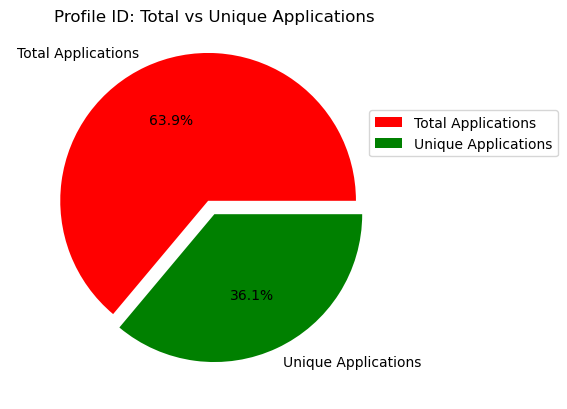

In [29]:
# Calculate total applications per Profile ID
total_apps = opportunity_data['Profile Id'].value_counts()

# Calculate unique applications per Profile ID
unique_apps = opportunity_data.drop_duplicates(subset=['Profile Id']).groupby('Profile Id').size()

# Create a DataFrame combining total and unique applications
applications = pd.DataFrame({'Total Applications': total_apps, 'Unique Applications': unique_apps})

# Explode parameter to highlight slices
explode = (0.1, 0)

# Plotting pie chart
applications.sum().plot(kind='pie', explode=explode, autopct='%1.1f%%', colors=['red', 'green'])
plt.title('Profile ID: Total vs Unique Applications')
plt.legend(bbox_to_anchor=(0.9, 0.8), labels=applications.columns)
plt.ylabel(' ')
plt.show()


# Opportunity Status Distribution:

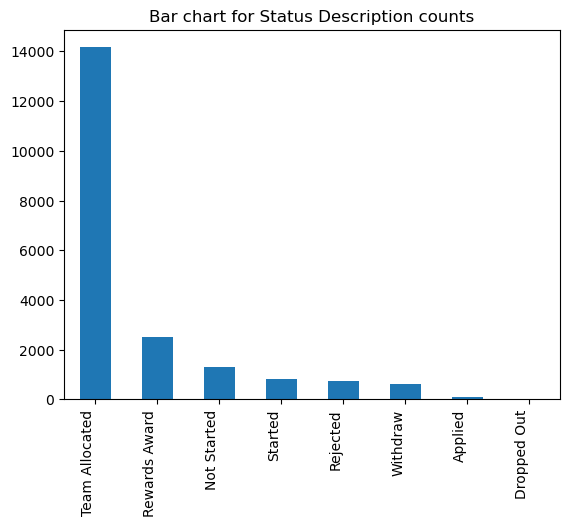

In [30]:
#Bar chart for 'Status Description' counts
sd=opportunity_data['Status Description'].value_counts()
sd.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Status Description'].name + " counts" )
plt.show()

Among the learners, the predominant status is "teams allocated," indicating that a significant majority have successfully had their teams assigned. The count for statuses such as "rewards awarded" exceeds 2000, while statuses like "not started" and "started" follow suit. The occurrence of the "dropped out" status is minimal.

# Basic Statistics:

Calculating basic statistics (mean, median, min, max) for relevant numeric columns (e.g., Reward Amount, Skill Points Earned).

In [36]:
#creating a dataframe with numerical variables

#num_od=opportunity_data.select_dtypes(include=['float64'])

In [37]:
#num_od.describe()

In [31]:
# Statistical analysis of the dataset
opportunity_data.describe()

,Reward Amount,Skill Points Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness,Apply Year,Apply Month,Opportunity Start Year,Opportunity Start Month,Opportunity End Year,Opportunity End Month,Graduation Year,Graduation Month,Apply Hour,Age
count,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,20258.000000,19795.000000,20258.000000
mean,133.641524,147.182940,0.107957,0.107365,0.115312,0.001432,0.017721,0.001234,0.015549,0.074489,0.102478,0.036529,0.001777,0.001037,0.000691,2022.965446,6.771251,2023.088113,6.553411,2023.776385,3.154457,2022.421315,6.445306,12.273301,21.578685
std,482.066680,415.734528,0.310334,0.309584,0.319407,0.037809,0.131940,0.035109,0.123727,0.262572,0.303283,0.187606,0.042119,0.032181,0.026280,0.182652,2.075677,0.355613,3.020562,0.434653,3.715015,3.616161,2.880533,6.123784,3.616161
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2022.000000,1.000000,2022.000000,1.000000,2022.000000,1.000000,1987.000000,1.000000,1.000000,16.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2023.000000,6.000000,2023.000000,5.000000,2024.000000,1.000000,2022.000000,5.000000,7.000000,19.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2023.000000,7.000000,2023.000000,7.000000,2024.000000,1.000000,2023.000000,6.000000,13.000000,21.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2023.000000,8.000000,2023.000000,8.000000,2024.000000,3.000000,2025.000000,8.000000,17.000000,22.000000
max,2500.000000,1776.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2023.000000,12.000000,2024.000000,12.000000,2025.000000,12.000000,2028.000000,12.000000,23.000000,57.000000


# Initial Observations:

### initial observations/patterns noticed during the exploratory analysis:

1. Only a small percentage of learners, approximately 15%, succeed in acquiring the skills or skill points out of the vast pool of over 20,000 engaged learners.

2. Most learners are engaged for internships than any other opportunity.

3. In the realm of opportunities, the count of learners specializing in Data Visualization takes the lead.

### potential areas of interest for deeper investigation in the upcoming weeks:

Deeper Investigations needed in the Skills Earned feature.

### 2.EDA Analysis

In [35]:
cont_vars = ["Reward Amount","Skill Points Earned","Creative Thinking","Technology Literacy","Communication",
            "Career Readiness","Initiative","Media Literacy","Leadership","Information Literacy","Collaboration",
            "Flexibility","Productivity","Social Skills","College Readiness","Apply Year","Apply Month",
             "Opportunity Start Year","Opportunity Start Month","Opportunity End Year","Opportunity End Month",
             "Graduation Year","Graduation Month","Apply Hour","Estimated Age","Age"]

cat_vars = ["Opportunity Name","Opportunity Category","Gender","City","State","Country",
            "Current Student Status","Current/Intended Major","Status Description","Skills Earned"]

In [32]:
opportunity_data.dtypes

Profile Id                  object
Opportunity Name            object
Opportunity Category        object
Gender                      object
City                        object
State                       object
Country                     object
Current Student Status      object
Current/Intended Major      object
Status Description          object
Reward Amount                int64
Badge Name                  object
Skill Points Earned          int64
Creative Thinking            int64
Technology Literacy          int64
Communication                int64
Career Readiness             int64
Initiative                   int64
Media Literacy               int64
Leadership                   int64
Information Literacy         int64
Collaboration                int64
Flexibility                  int64
Productivity                 int64
Social Skills                int64
College Readiness            int64
Apply Year                   int64
Apply Month                  int64
Opportunity Start Ye

### 2.1 Univariate Analysis

Univariate Analysis -> Analyzing one variable at a time (Mandatory)

i.Histogram ii.Countplot iii.Boxplot

Histogram for Reward Amount


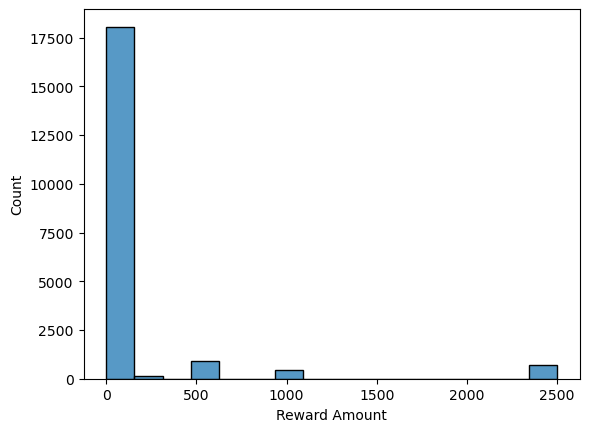

Histogram for Skill Points Earned


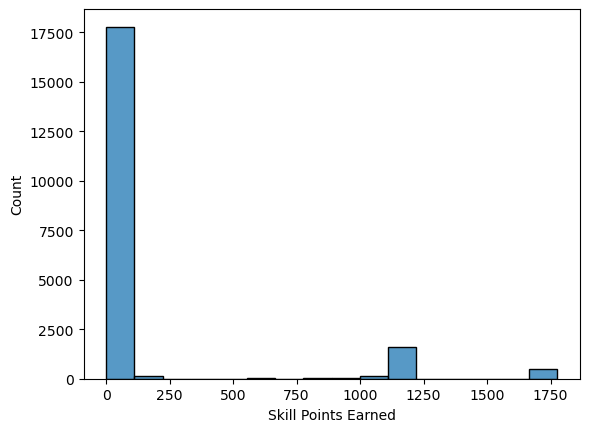

Histogram for Creative Thinking


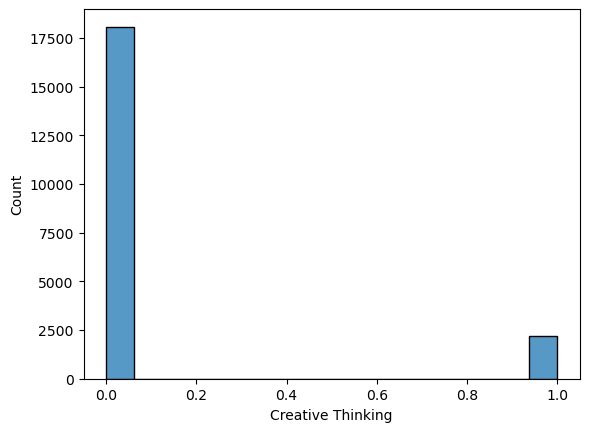

Histogram for Technology Literacy


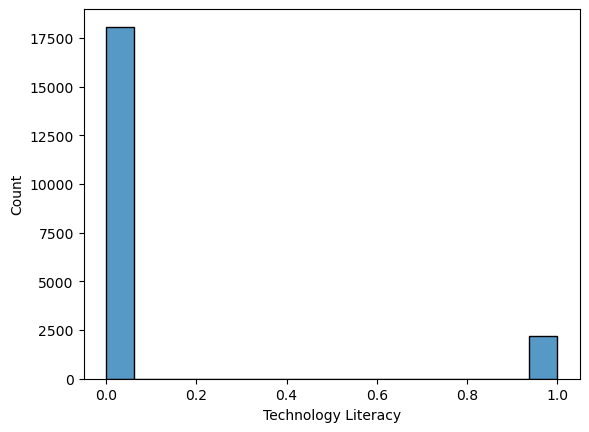

Histogram for Communication


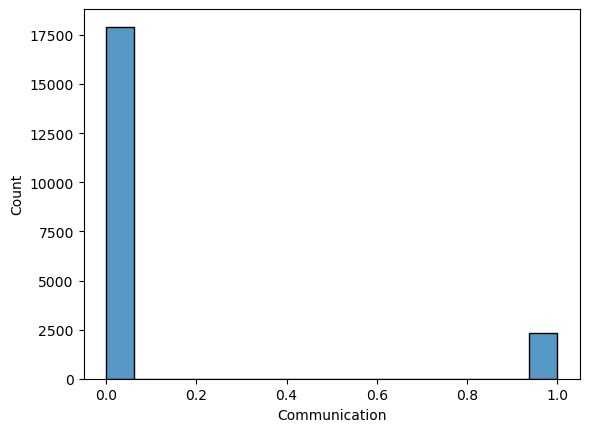

Histogram for Career Readiness


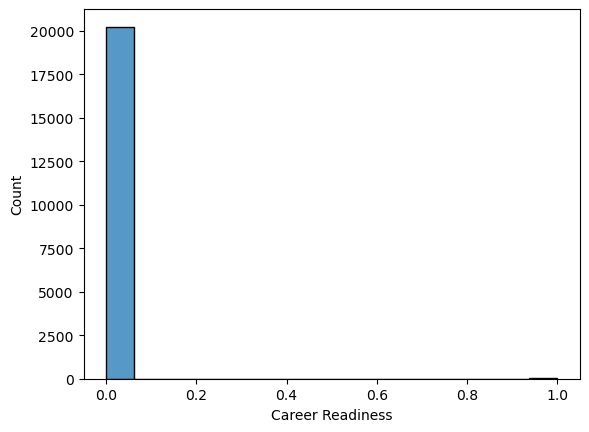

Histogram for Initiative


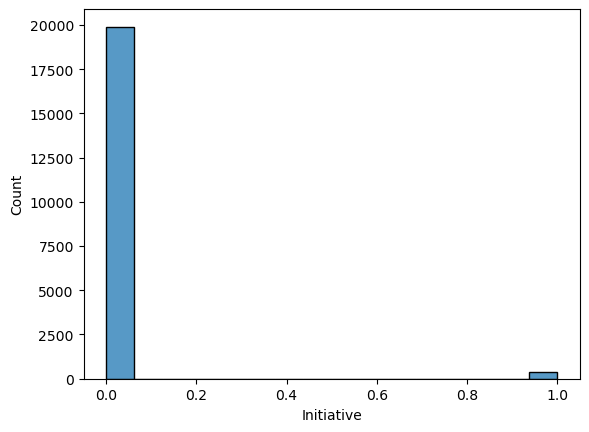

Histogram for Media Literacy


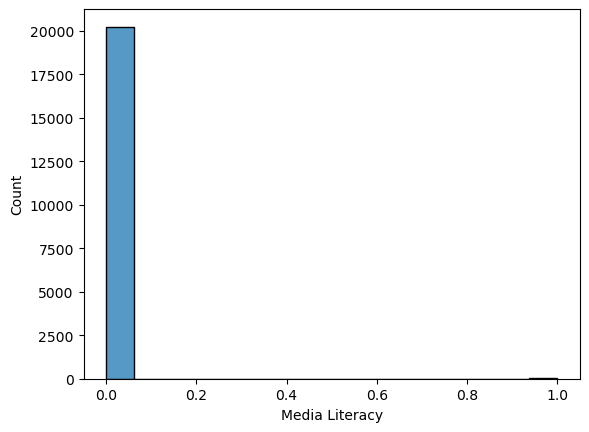

Histogram for Leadership


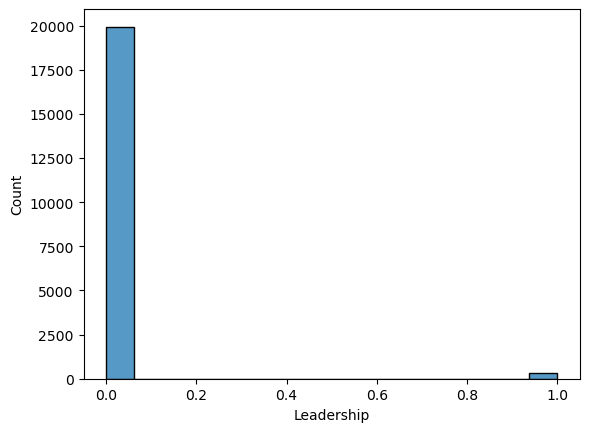

Histogram for Information Literacy


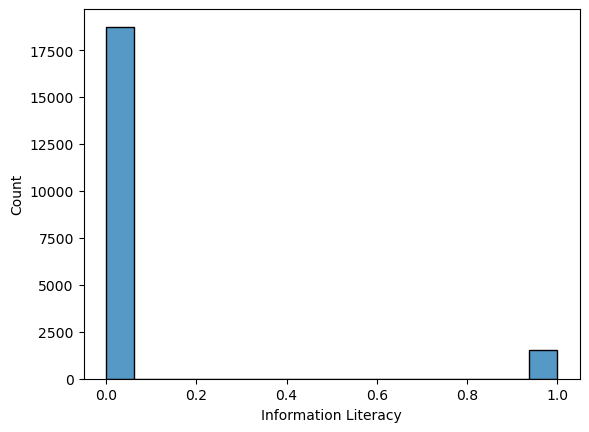

Histogram for Collaboration


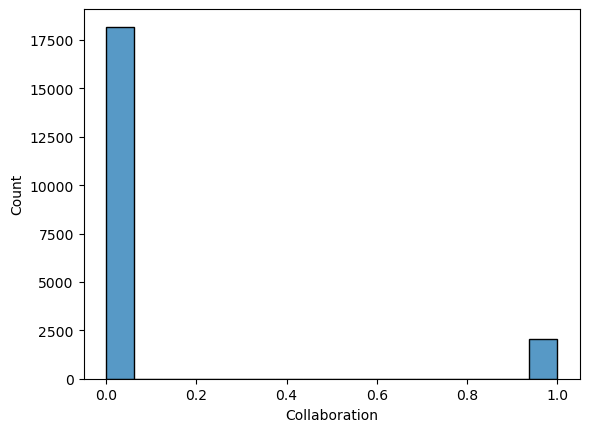

Histogram for Flexibility


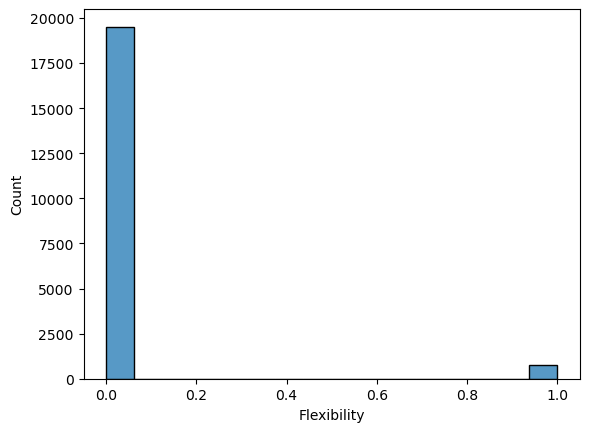

Histogram for Productivity


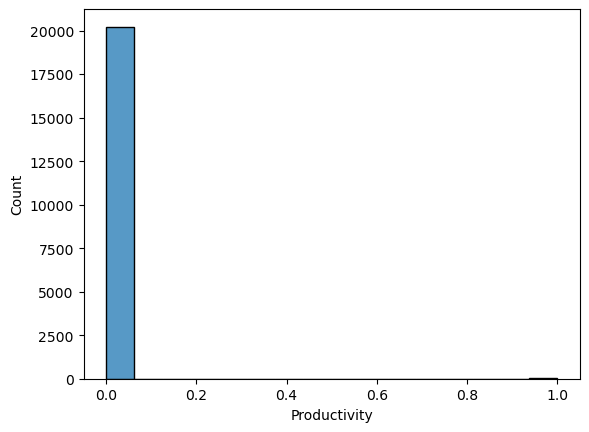

Histogram for Social Skills


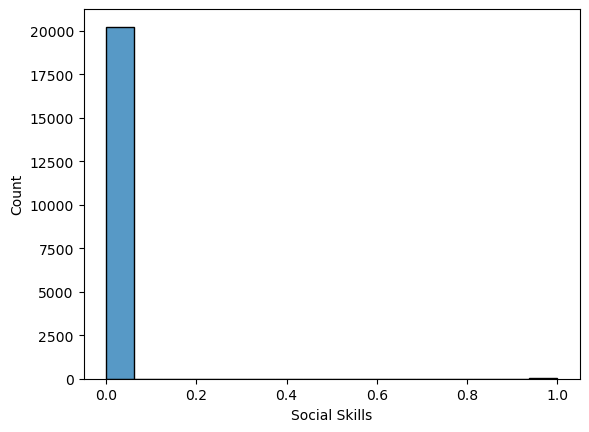

Histogram for College Readiness


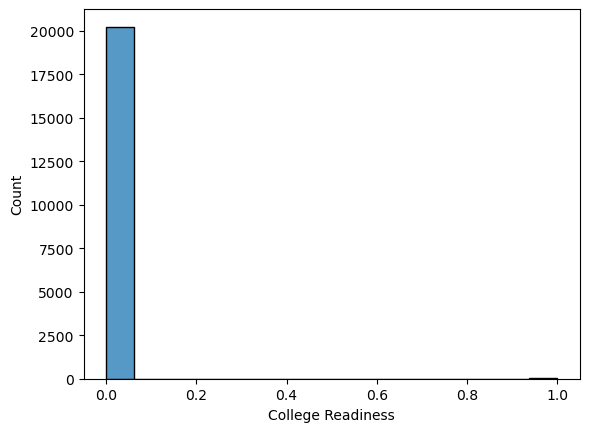

Histogram for Apply Year


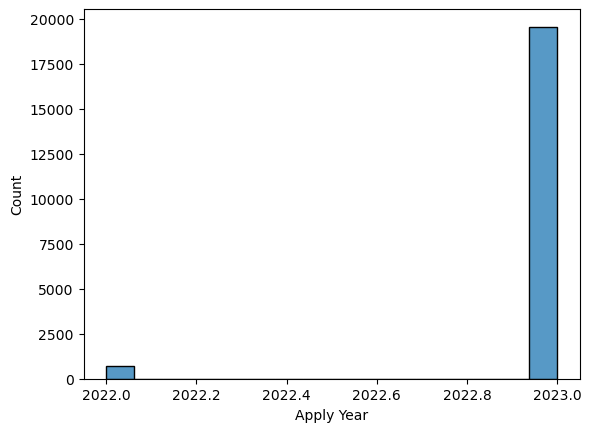

Histogram for Apply Month


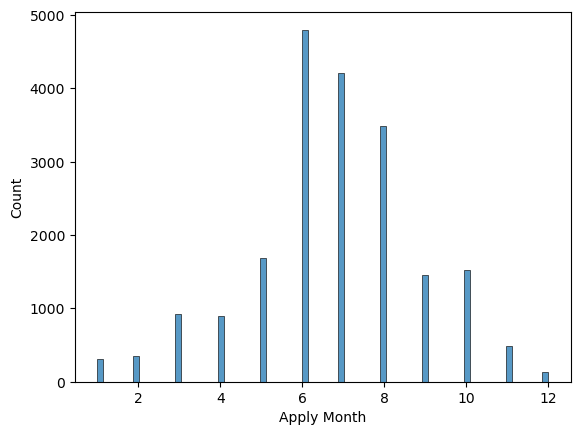

Histogram for Opportunity Start Year


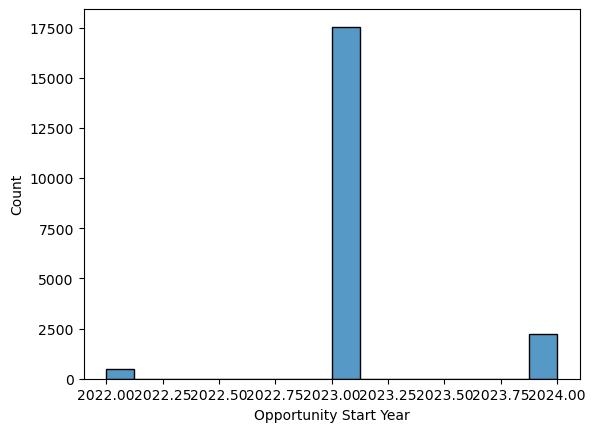

Histogram for Opportunity Start Month


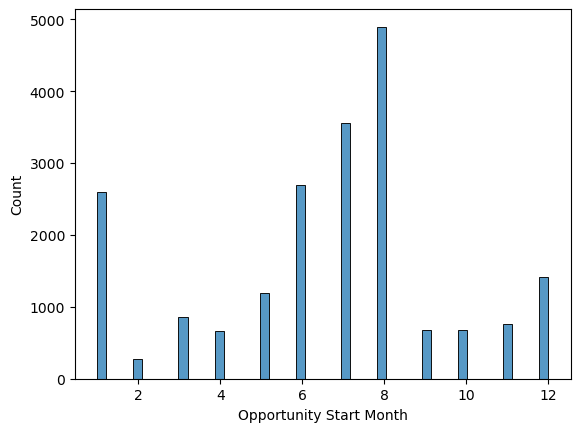

Histogram for Opportunity End Year


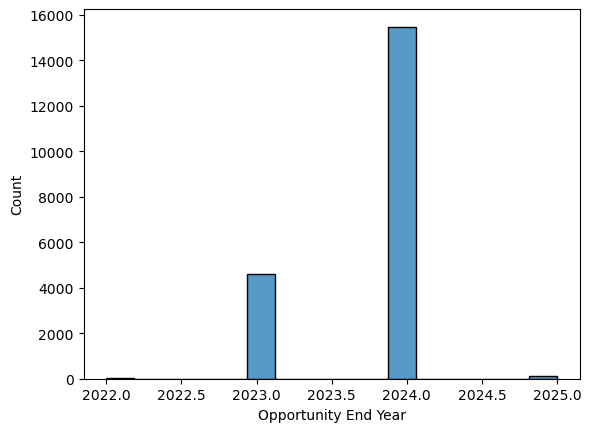

Histogram for Opportunity End Month


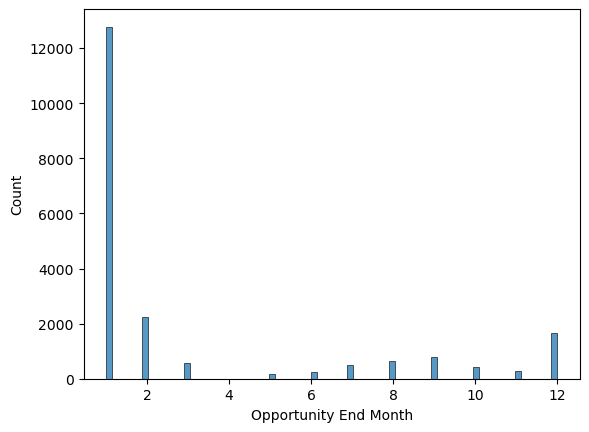

Histogram for Graduation Year


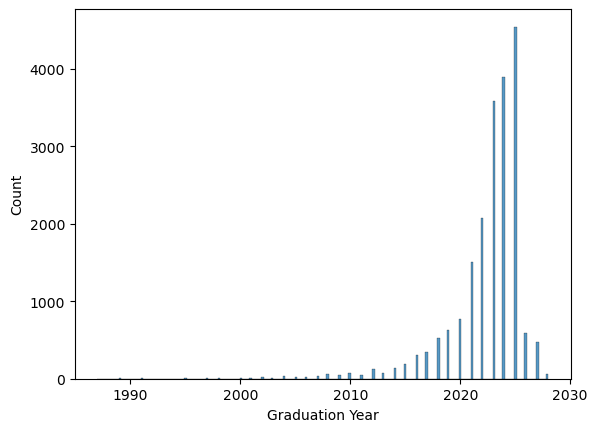

Histogram for Graduation Month


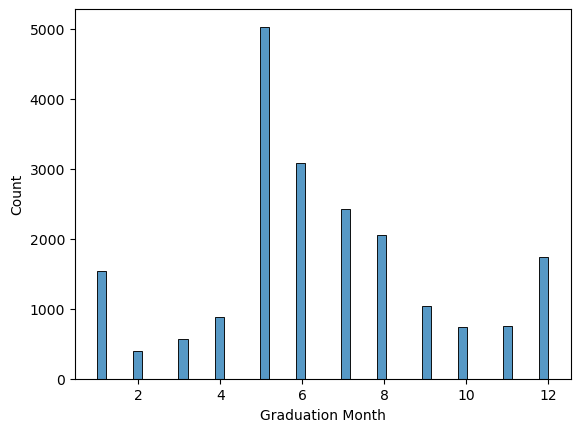

Histogram for Apply Hour


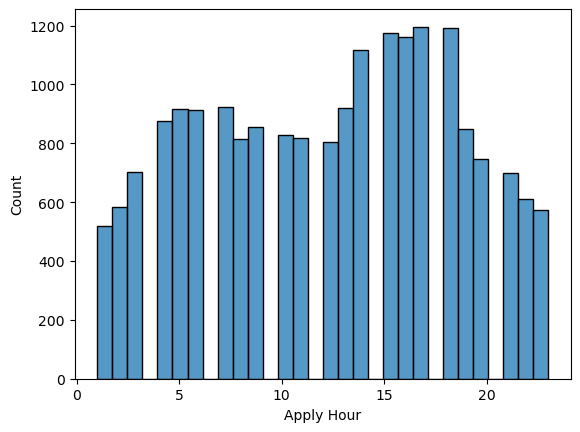

Histogram for Estimated Age


KeyError: 'Estimated Age'

In [36]:
#Univariate analysis - Histogram for continuous variable
for i in cont_vars:
    print("Histogram for "+i)
    sns.histplot(opportunity_data[i])
    plt.show()

Boxplot for Reward Amount


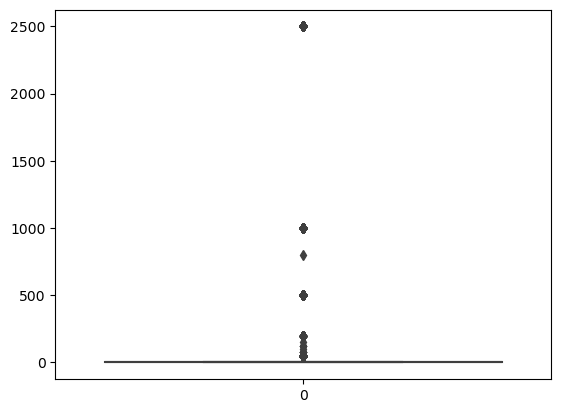

Boxplot for Skill Points Earned


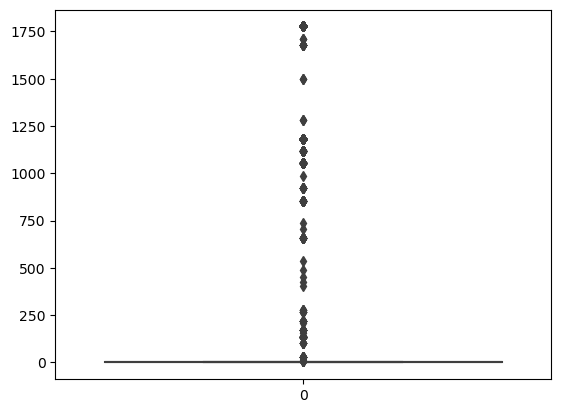

Boxplot for Creative Thinking


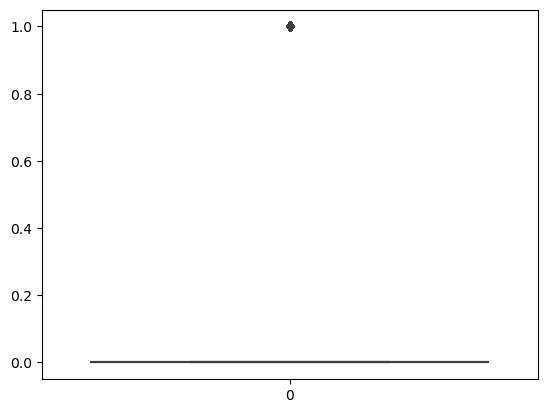

Boxplot for Technology Literacy


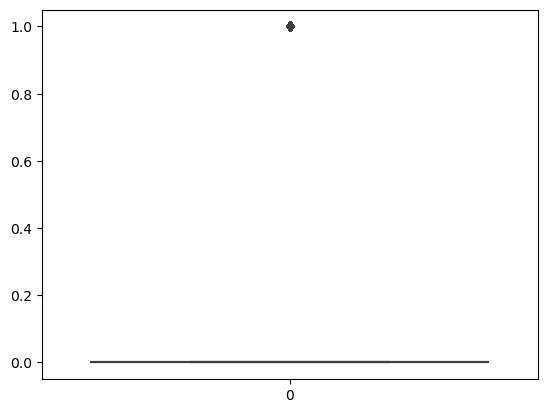

Boxplot for Communication


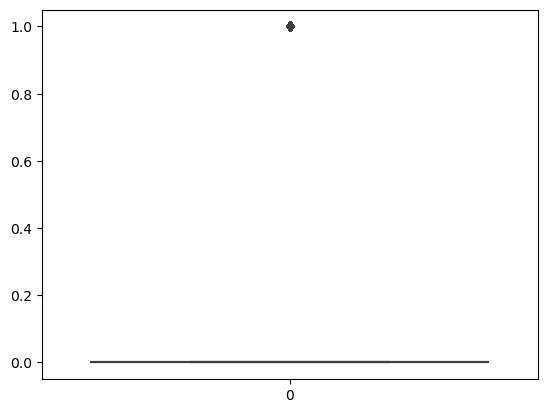

Boxplot for Career Readiness


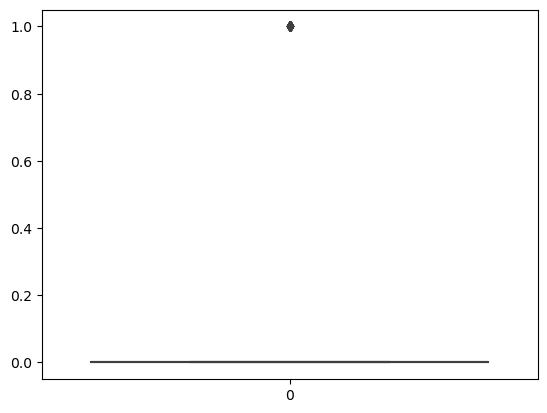

Boxplot for Initiative


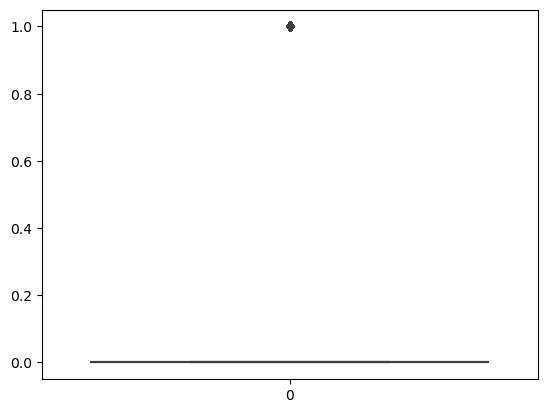

Boxplot for Media Literacy


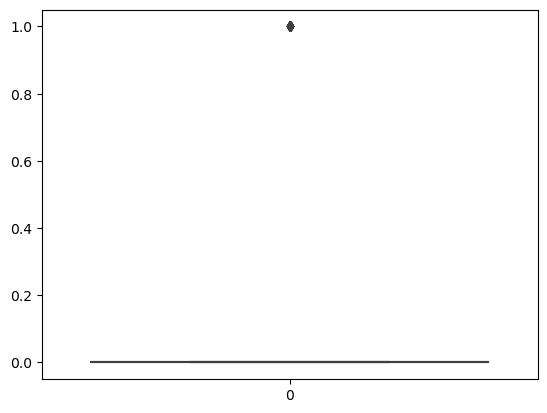

Boxplot for Leadership


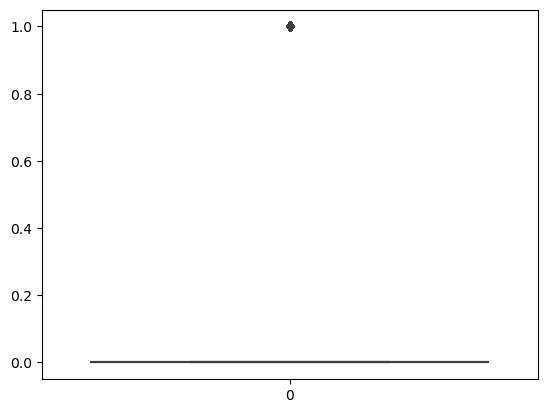

Boxplot for Information Literacy


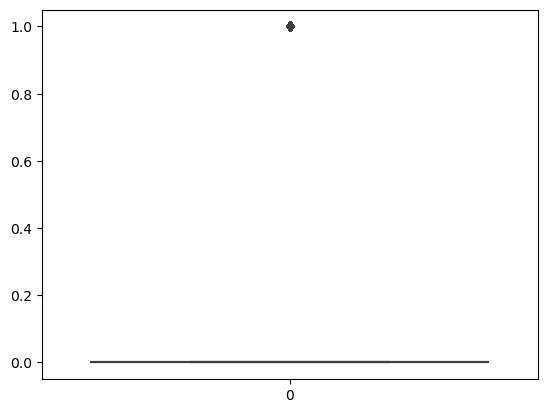

Boxplot for Collaboration


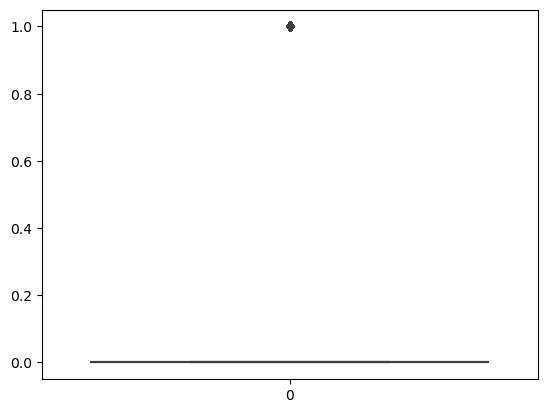

Boxplot for Flexibility


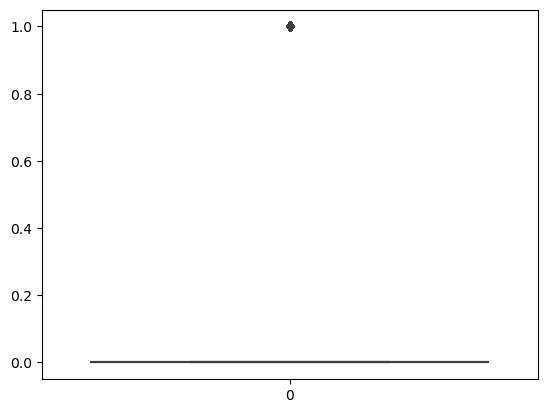

Boxplot for Productivity


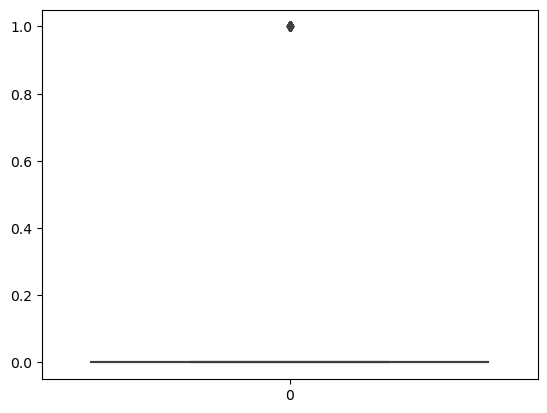

Boxplot for Social Skills


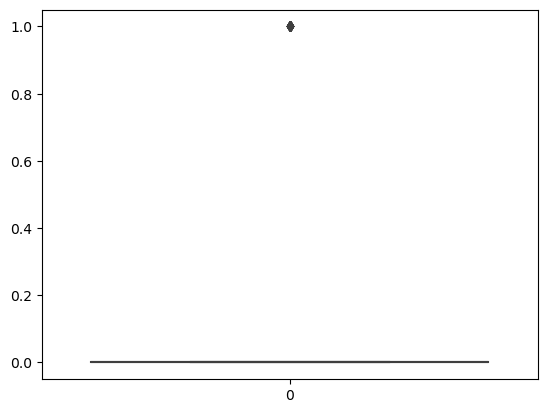

Boxplot for College Readiness


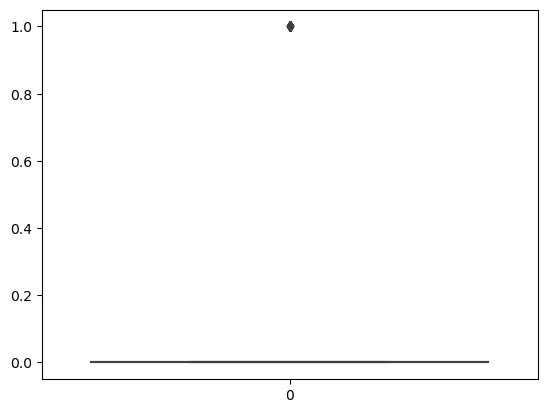

Boxplot for Apply Year


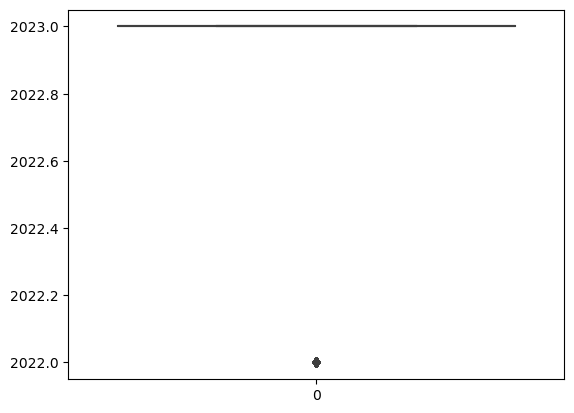

Boxplot for Apply Month


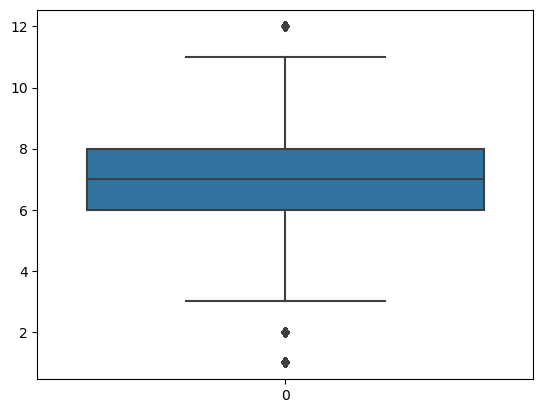

Boxplot for Opportunity Start Year


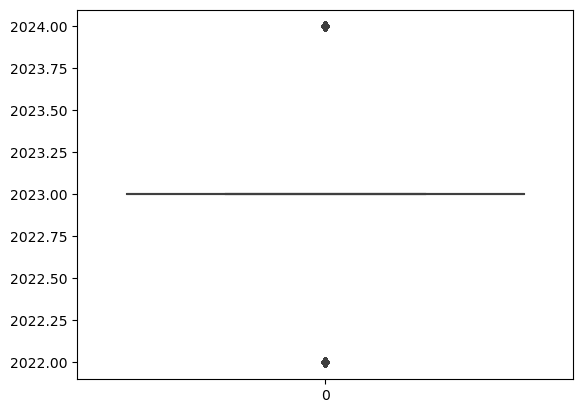

Boxplot for Opportunity Start Month


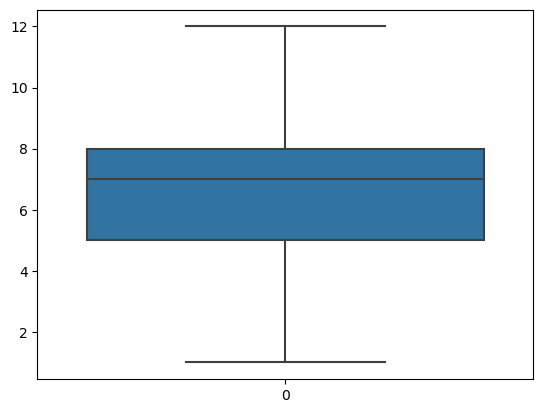

Boxplot for Opportunity End Year


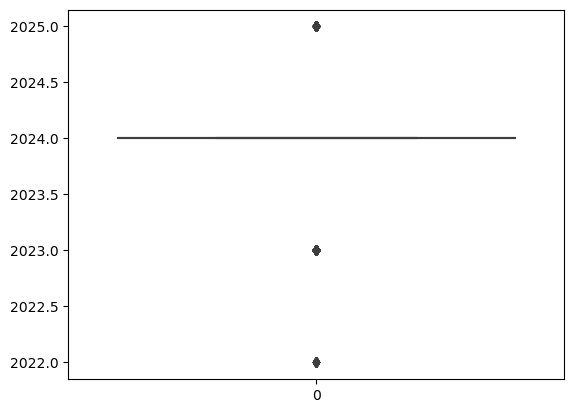

Boxplot for Opportunity End Month


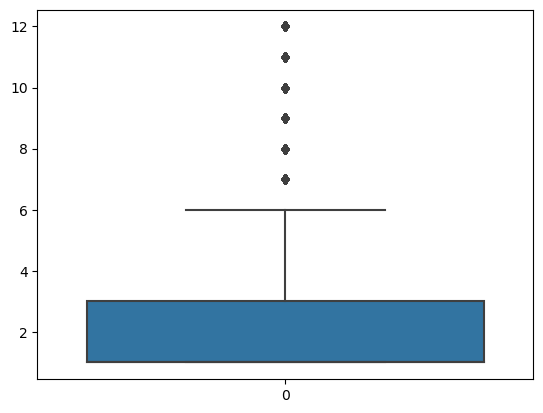

Boxplot for Graduation Year


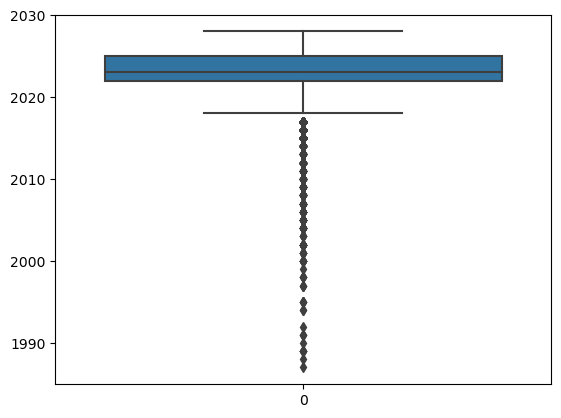

Boxplot for Graduation Month


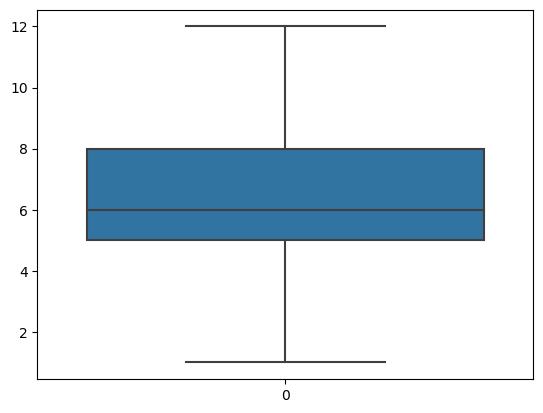

Boxplot for Apply Hour


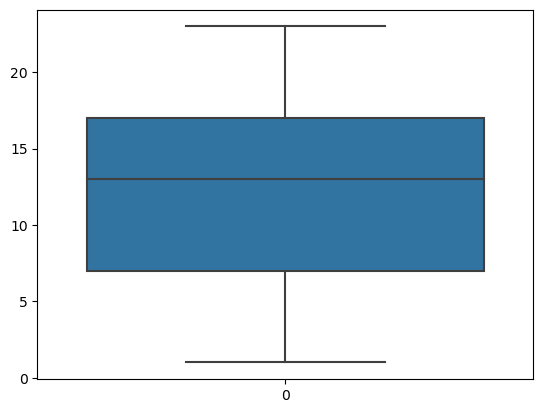

Boxplot for Estimated Age


KeyError: 'Estimated Age'

In [37]:
#Univariate analysis - boxplot for continuous variable
for i in cont_vars:
    print("Boxplot for "+i)
    sns.boxplot(opportunity_data[i])
    plt.show()

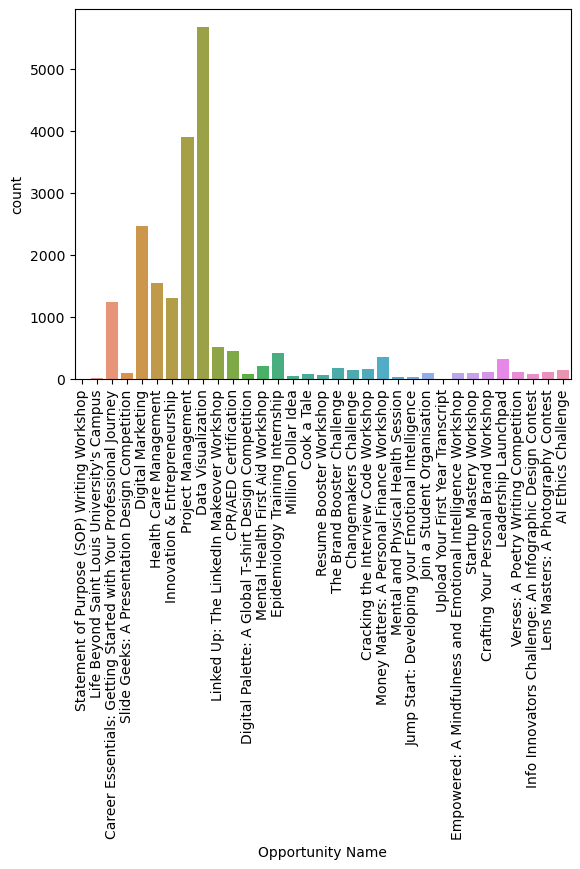

In [38]:
#Univariate analysis for continous variables
sns.countplot(data=opportunity_data, x='Opportunity Name')
plt.xticks(rotation=90)  # Rotating x-axis labels for better visibility if needed
plt.show()

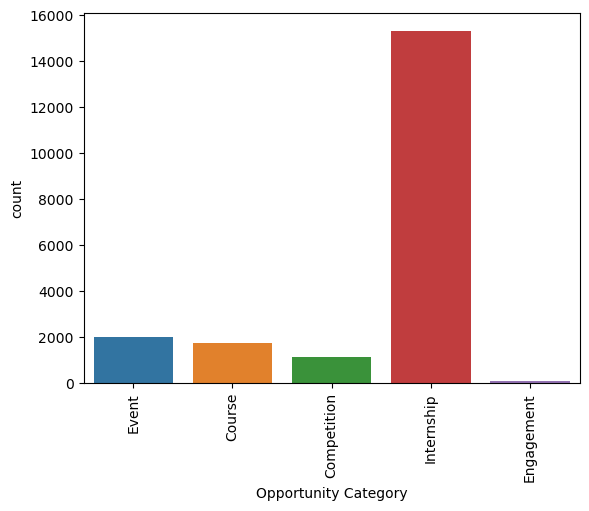

In [39]:
#Univariate analysis for continous variables
sns.countplot(data=opportunity_data, x='Opportunity Category')
plt.xticks(rotation=90)  # Rotating x-axis labels for better visibility if needed
plt.show()

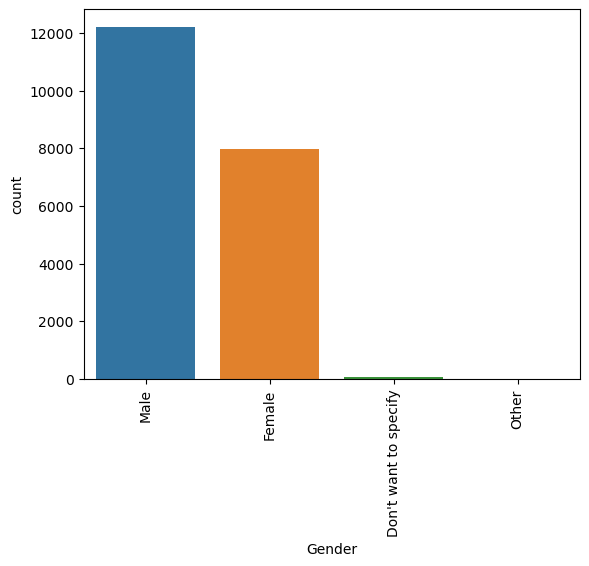

In [40]:
#Univariate analysis for continous variables
sns.countplot(data=opportunity_data, x='Gender')
plt.xticks(rotation=90)  # Rotating x-axis labels for better visibility if needed
plt.show()

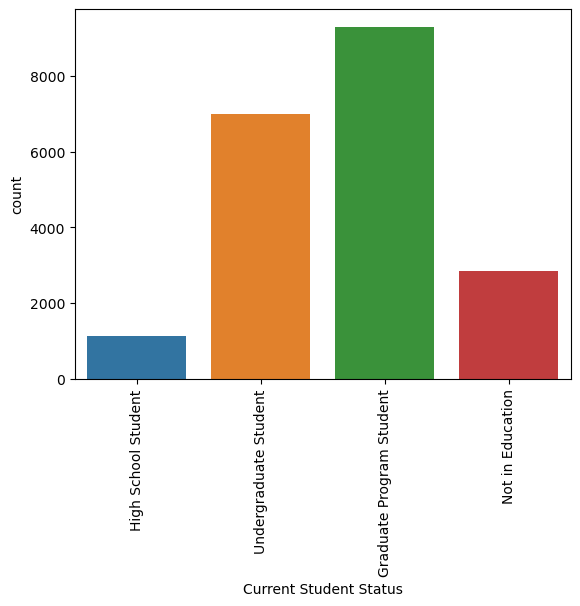

In [41]:
#Univariate analysis for continous variables
sns.countplot(data=opportunity_data, x='Current Student Status')
plt.xticks(rotation=90)  # Rotating x-axis labels for better visibility if needed
plt.show()

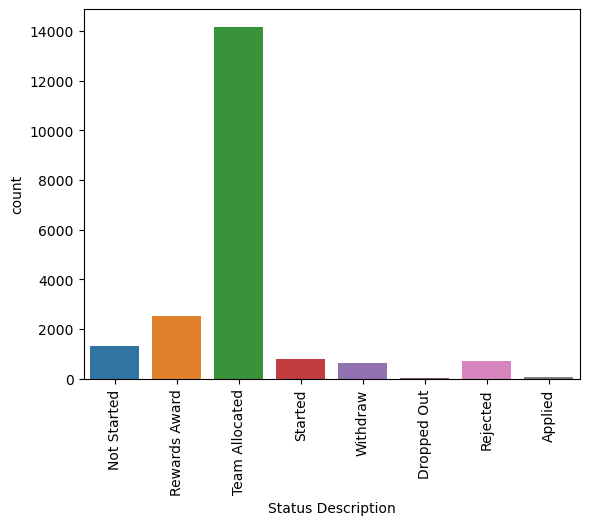

In [42]:
#Univariate analysis for continous variables
sns.countplot(data=opportunity_data, x='Status Description')
plt.xticks(rotation=90)  # Rotating x-axis labels for better visibility if needed
plt.show()

### 2.2 Bivariate Analysis

In [43]:
cont_vars = ["Reward Amount","Skill Points Earned","Creative Thinking","Technology Literacy","Communication",
            "Career Readiness","Initiative","Media Literacy","Leadership","Information Literacy","Collaboration",
            "Flexibility","Productivity","Social Skills","College Readiness","Apply Year","Apply Month",
             "Opportunity Start Year","Opportunity Start Month","Opportunity End Year","Opportunity End Month",
             "Graduation Year","Graduation Month","Apply Hour","Estimated Age","Age"]

cat_vars = ["Opportunity Name","Opportunity Category","Gender","City","State","Country",
            "Current Student Status","Current/Intended Major","Status Description","Skills Earned"]

### 2.3 Multivariate Analysis

In [44]:
num_vars1 = opportunity_data[['Reward Amount','Skill Points Earned']]

<Figure size 640x480 with 0 Axes>

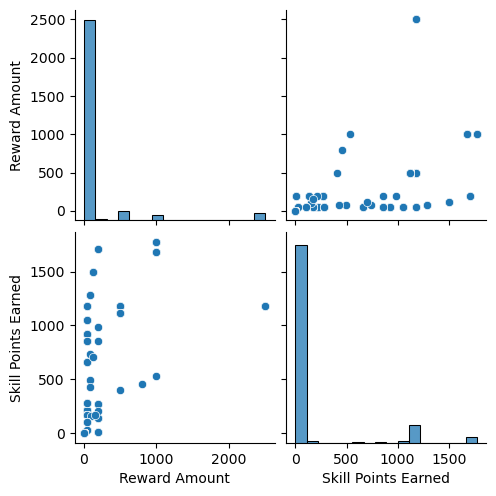

In [45]:
plt.figure()
sns.pairplot(num_vars1)
plt.show()

In [46]:
num_vars2 = opportunity_data[["Creative Thinking","Technology Literacy","Communication",
            "Career Readiness","Initiative","Media Literacy","Leadership","Information Literacy","Collaboration",
            "Flexibility","Productivity","Social Skills","College Readiness"]]

<Figure size 640x480 with 0 Axes>

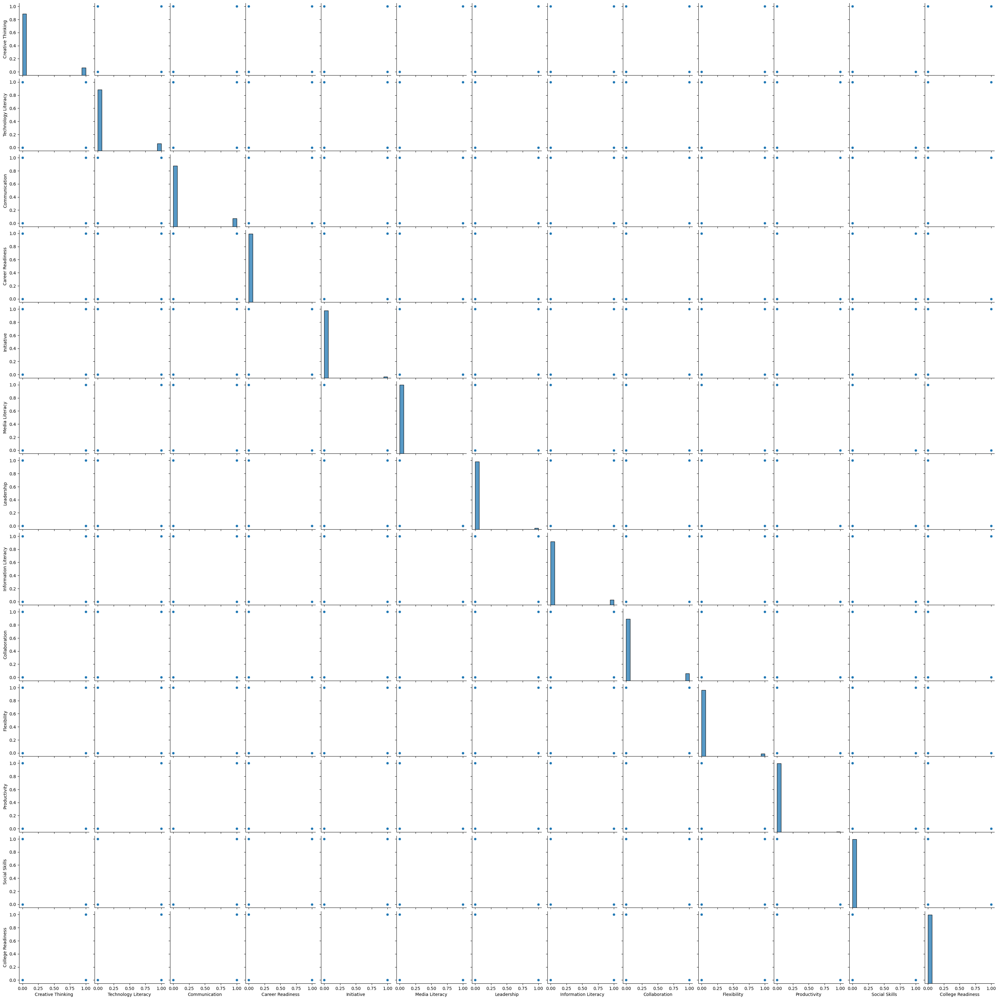

In [47]:
plt.figure()
sns.pairplot(num_vars2)
plt.show()

In [48]:
num_vars3 = opportunity_data[["Apply Year","Apply Month",
             "Opportunity Start Year","Opportunity Start Month","Opportunity End Year","Opportunity End Month",
             "Graduation Year","Graduation Month","Apply Hour","Age"]]

<Figure size 640x480 with 0 Axes>

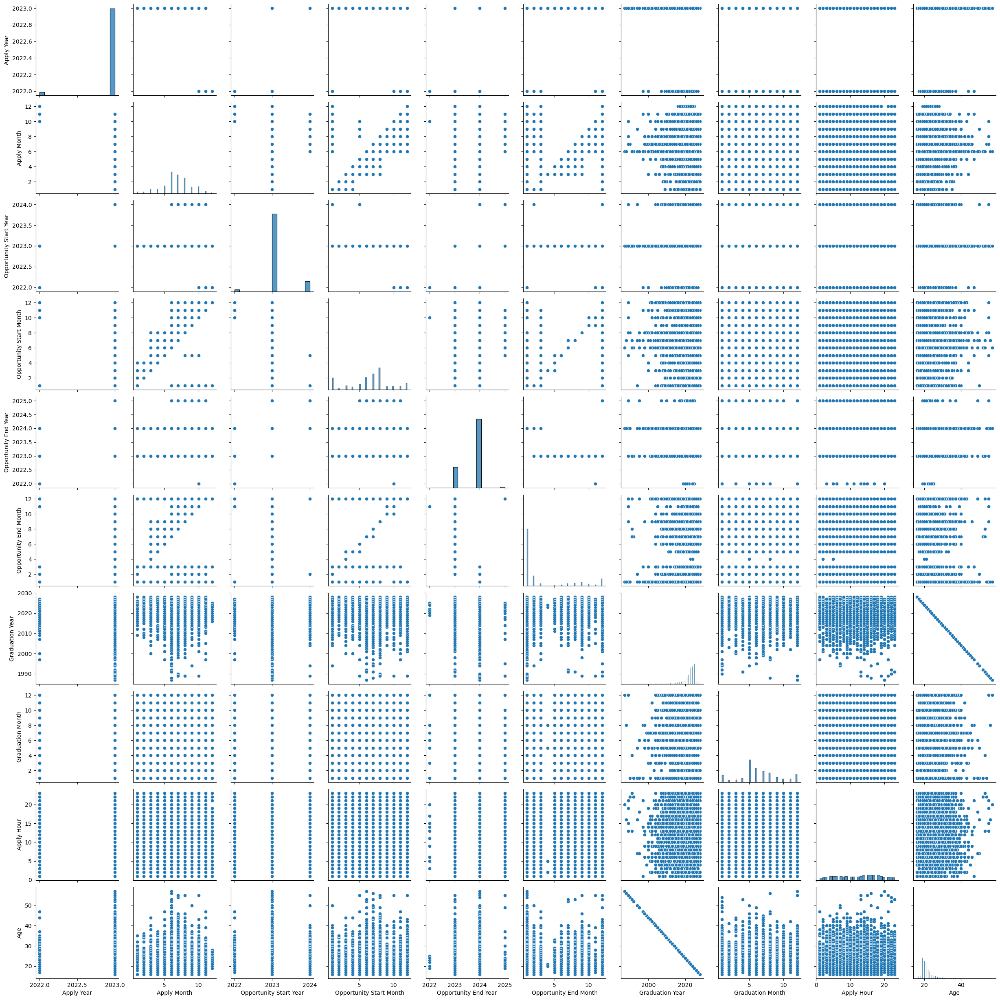

In [49]:
plt.figure()
sns.pairplot(num_vars3)
plt.show()

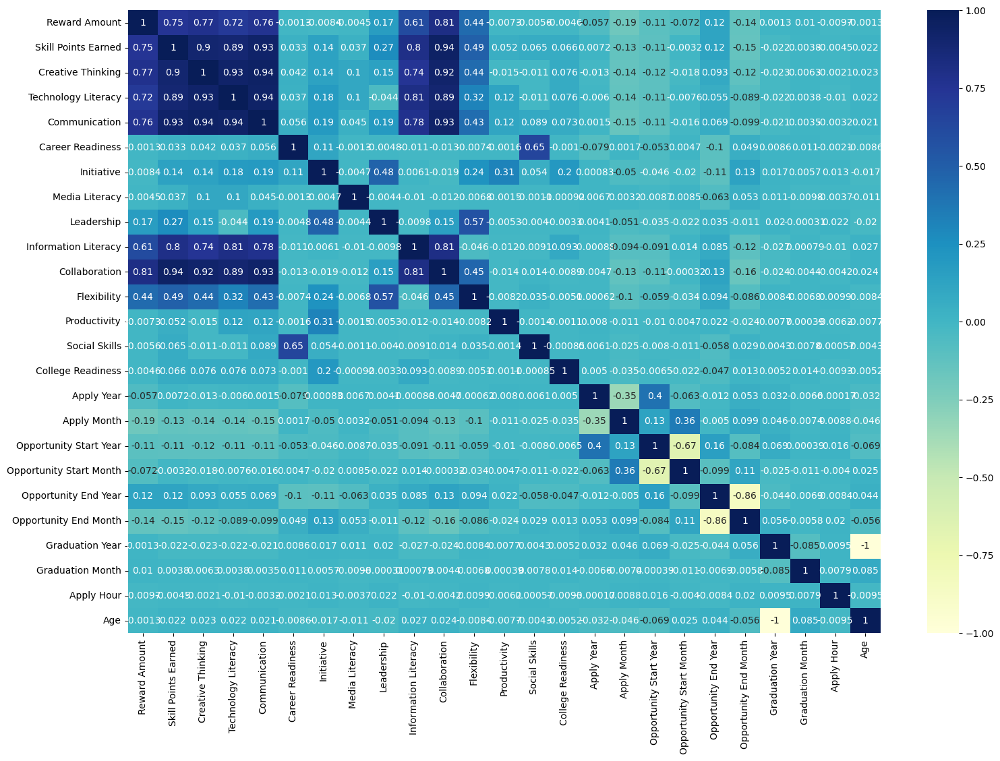

In [50]:
#Heatmaps
plt.figure(figsize=(18,12))
sns.heatmap(opportunity_data.corr(),annot=True,cmap="YlGnBu")
plt.show()

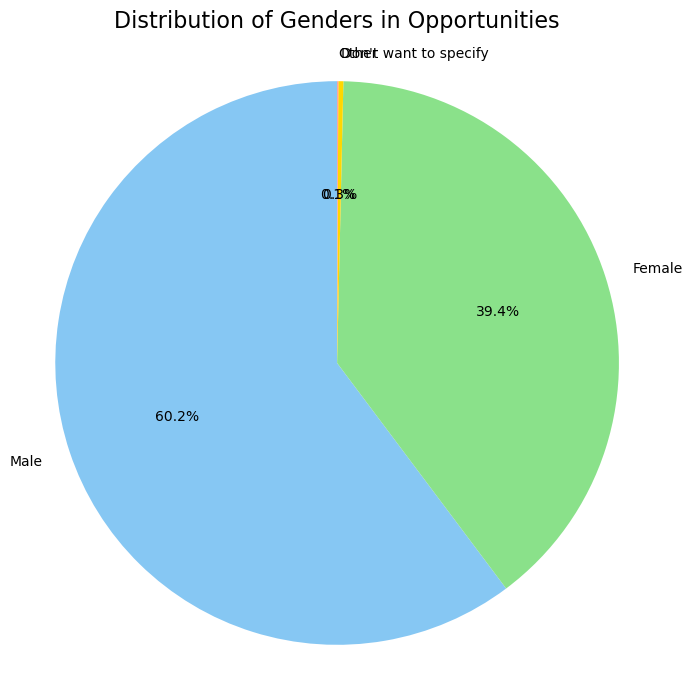

In [51]:
# Gender Distribution
gender_distribution = opportunity_data['Gender'].value_counts()
colors = ['#86c7f3', '#8ae18a', '#ffd700', '#ff9999']
plt.figure(figsize=(8, 8))
plt.pie(gender_distribution, labels=gender_distribution.index, autopct='%1.1f%%', startangle=90, colors=colors)
plt.axis('equal')  
plt.title('Distribution of Genders in Opportunities', fontsize=16, pad=20)
plt.show()

Among the learners who engaged on the website, 60.2% are males, 39.4% are females, and the remaining 0.4% comprises individuals categorized as others or those who choose not to specify their gender.

## Histograms (for understanding the distribution of  numerical data)

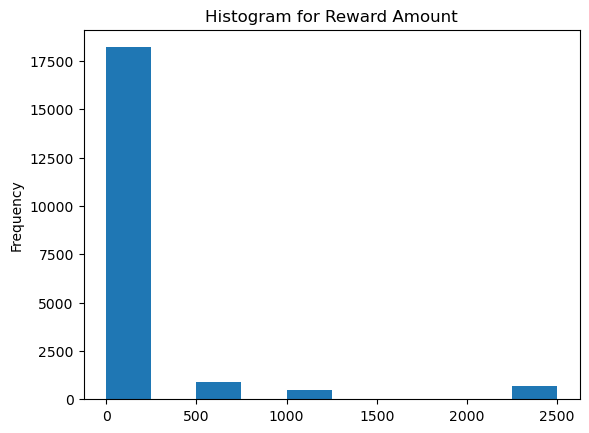

In [52]:
#Histogram for Reward Amount
opportunity_data['Reward Amount'].plot(kind = 'hist',bins = 10)
plt.title("Histogram for " + opportunity_data['Reward Amount'].name )
plt.show()

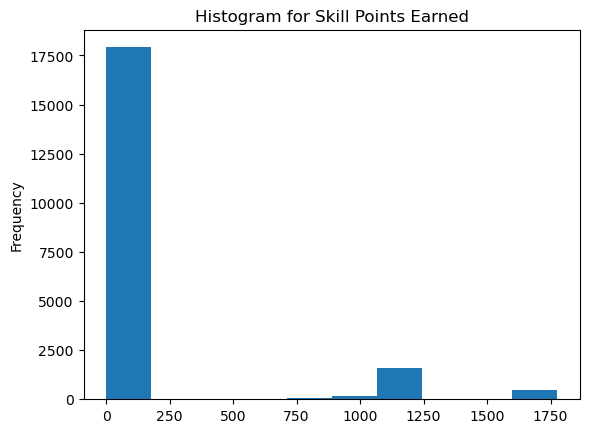

In [53]:
#Histogram for Skill Points Earned
opportunity_data['Skill Points Earned'].plot(kind = 'hist',bins = 10)
plt.title("Histogram for " + opportunity_data['Skill Points Earned'].name )
plt.show()

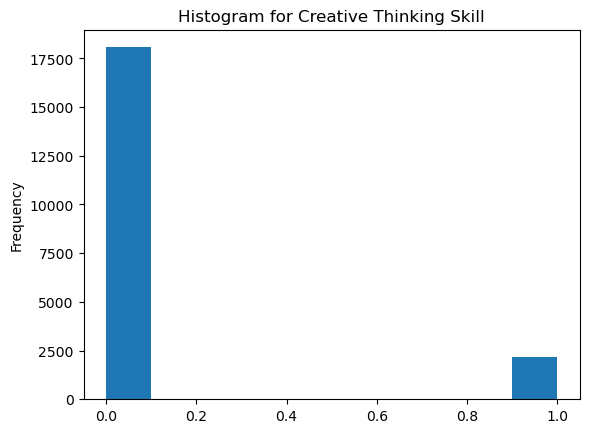

In [54]:
#Histogram for Creative Thinking Skill
opportunity_data['Creative Thinking'].plot(kind = 'hist',bins =10)
plt.title("Histogram for " + opportunity_data['Creative Thinking'].name+" Skill" )
plt.show()

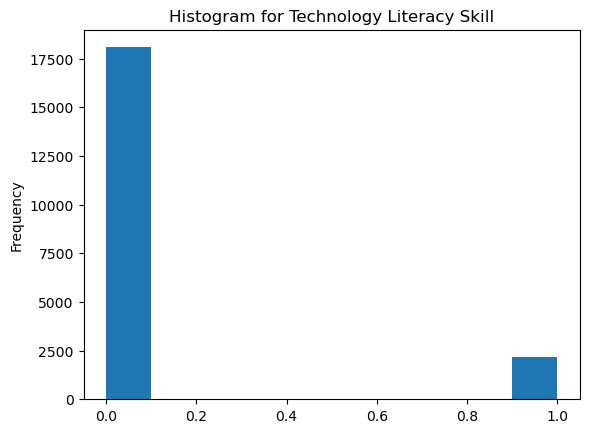

In [55]:
#Histogram for Technology Literacy Skill
opportunity_data['Technology Literacy'].plot(kind = 'hist',bins =10)
plt.title("Histogram for " + opportunity_data['Technology Literacy'].name+" Skill" )
plt.show()

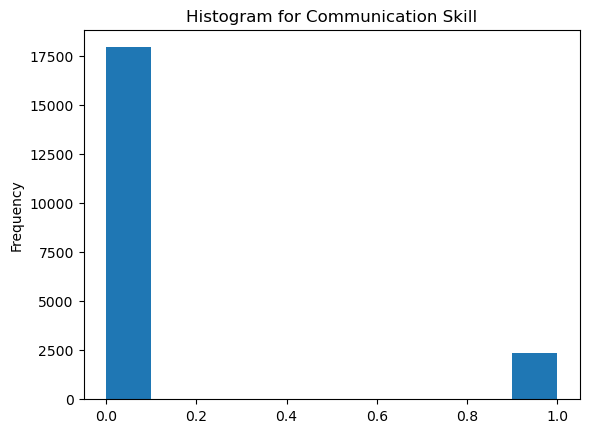

In [56]:
#Histogram for 'Communication' Skill
opportunity_data['Communication'].plot(kind = 'hist',bins =10)
plt.title("Histogram for " + opportunity_data['Communication'].name+" Skill" )
plt.show()

##### Upon analyzing the histograms above, it becomes apparent that only a small percentage of learners, approximately 15%, succeed in acquiring the skills or skill points out of the vast pool of over 20,000 engaged learners.

## Bar Charts for knowing the distribution of categorical data

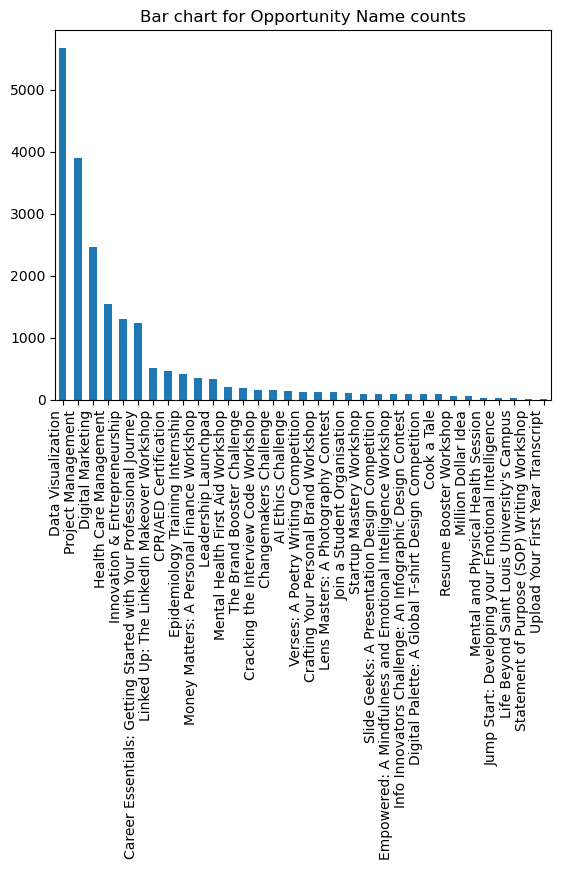

In [57]:
#Bar chart for opportunity name counts 
opportunity_names=opportunity_data['Opportunity Name'].value_counts()
opportunity_names.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Opportunity Name'].name + " counts" )
plt.show()

In the realm of opportunities, the count of learners specializing in Data Visualization takes the lead.

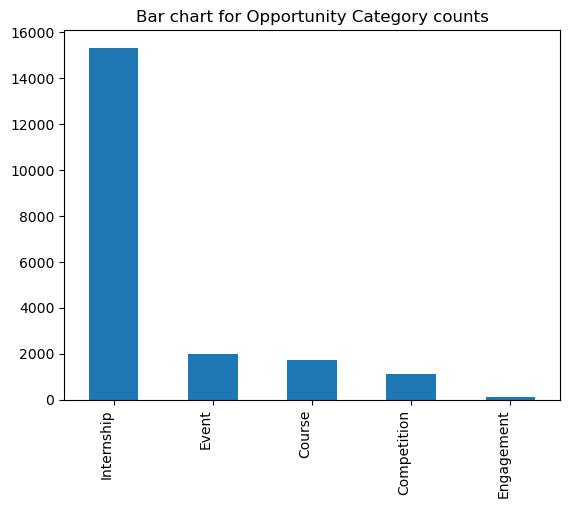

In [58]:
#Bar chart for Opportunity Category counts
opportunity_cat=opportunity_data['Opportunity Category'].value_counts()
opportunity_cat.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Opportunity Category'].name + " counts" )
plt.show()

Most learners are engaged for internships than any other opportunity.

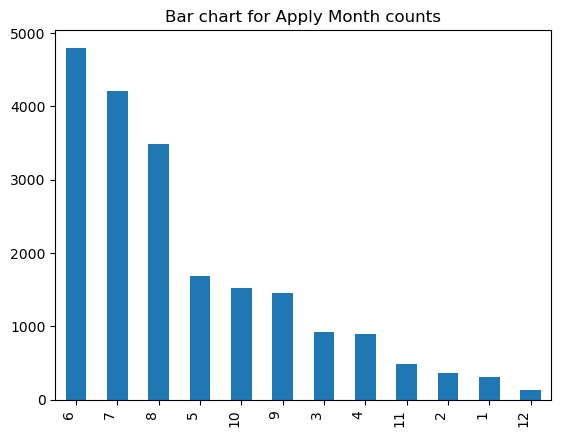

In [59]:
#Bar chart for Apply month counts
apply_month=opportunity_data['Apply Month'].value_counts()
apply_month.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Apply Month'].name + " counts" )
plt.show()

The highest enrollment numbers typically occur in June, July, and August, making these three months the most popular among learners.

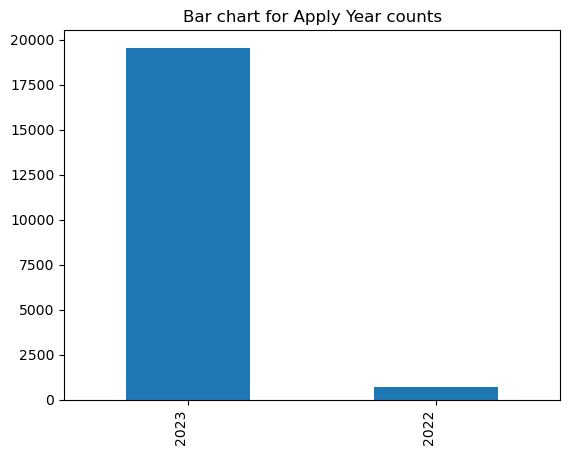

In [60]:
#Bar chart for Apply Year counts
apply_year=opportunity_data['Apply Year'].value_counts()
apply_year.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Apply Year'].name + " counts" )
plt.show()

Majority of learners applied in the year 2023.

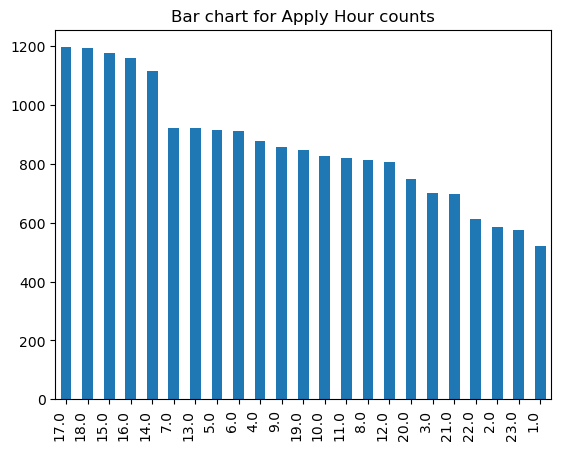

In [61]:
#Bar chart for 'Apply Hour' counts
apply_hour=opportunity_data['Apply Hour'].value_counts()
apply_hour.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Apply Hour'].name + " counts" )
plt.show()

The peak application period for most learners typically falls between 2:00 PM and 6:00 PM.

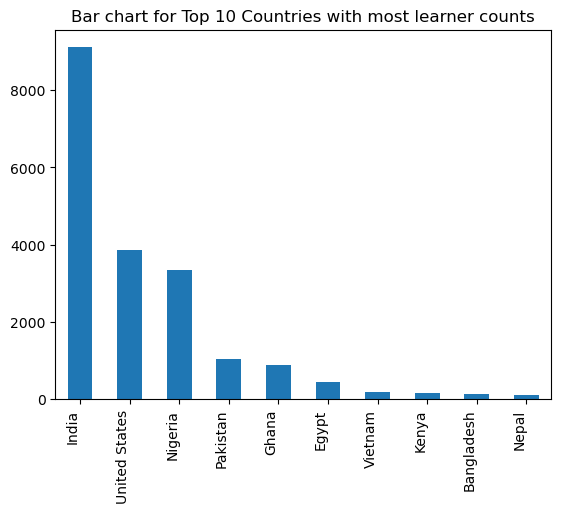

In [62]:
#Bar chart for Top 10 Countries with most learner counts
top_10_country=(opportunity_data['Country'].value_counts()).iloc[:10]
top_10_country.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for Top 10 Countries with most learner counts" )
plt.show()

The highest number of engaged learners is found in India, with the United States, Nigeria, Pakistan, and other countries following suit.

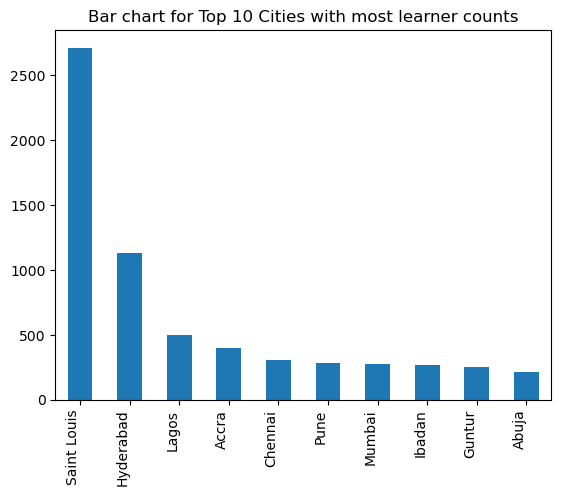

In [63]:
#Bar chart for Top 10 Cities with most learner counts
top_10_cities=(opportunity_data['City'].value_counts()).iloc[:10]
top_10_cities.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for Top 10 Cities with most learner counts" )
plt.show()

Saint Louis City boasts the highest number of learners, securing the top position. Hyderabad follows closely in second place, with Lagos taking the third spot. Remarkably, among the top 10 positions, more than four Indian cities are prominently featured.

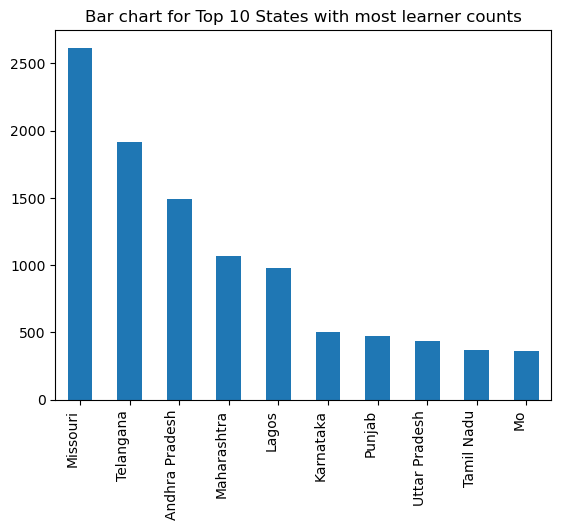

In [64]:
#Bar chart for Top 10 States with most learner counts
top_10_states=(opportunity_data['State'].value_counts()).iloc[:10]
top_10_states.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for Top 10 States with most learner counts" )
plt.show()

Missouri takes the lead as the top state with the highest number of learners, closely followed by Telangana. Notably, within the top 10 positions, seven out of the ten are occupied by Indian states.

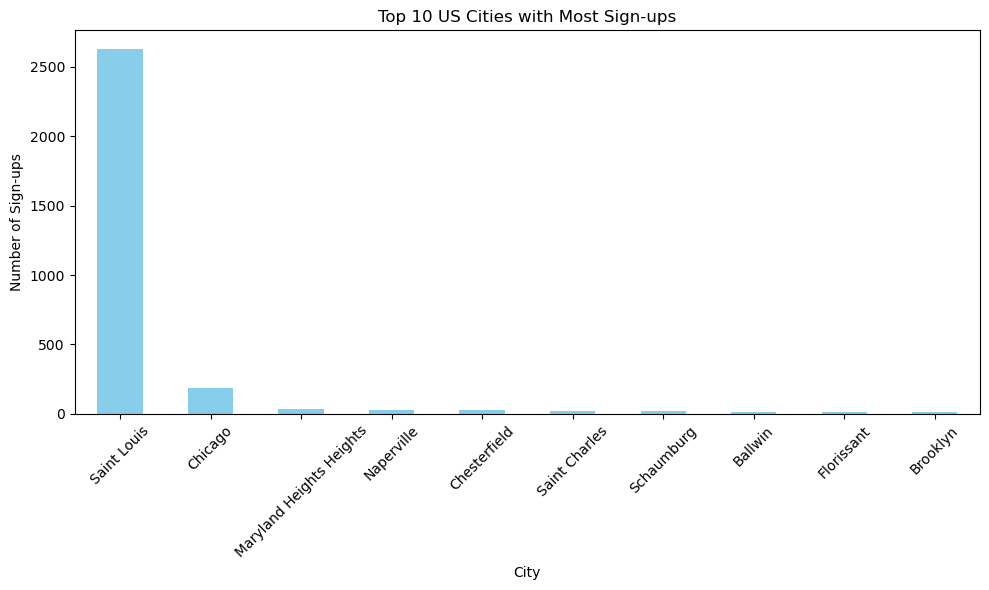

In [65]:
# US City Insights

# Filter data for sign-ups from the US
us_signups = opportunity_data[opportunity_data['Country'] == 'United States']

# Count sign-ups per city in the US and select the top 10 cities
top_10_us_cities = us_signups['City'].value_counts().head(10)

# Create a bar plot for top 10 cities
plt.figure(figsize=(10, 6))
top_10_us_cities.plot(kind='bar', color='skyblue')
plt.title('Top 10 US Cities with Most Sign-ups')
plt.xlabel('City')
plt.ylabel('Number of Sign-ups')
plt.xticks(rotation=45)  # Rotate x-labels for better readability
plt.tight_layout()
plt.show()



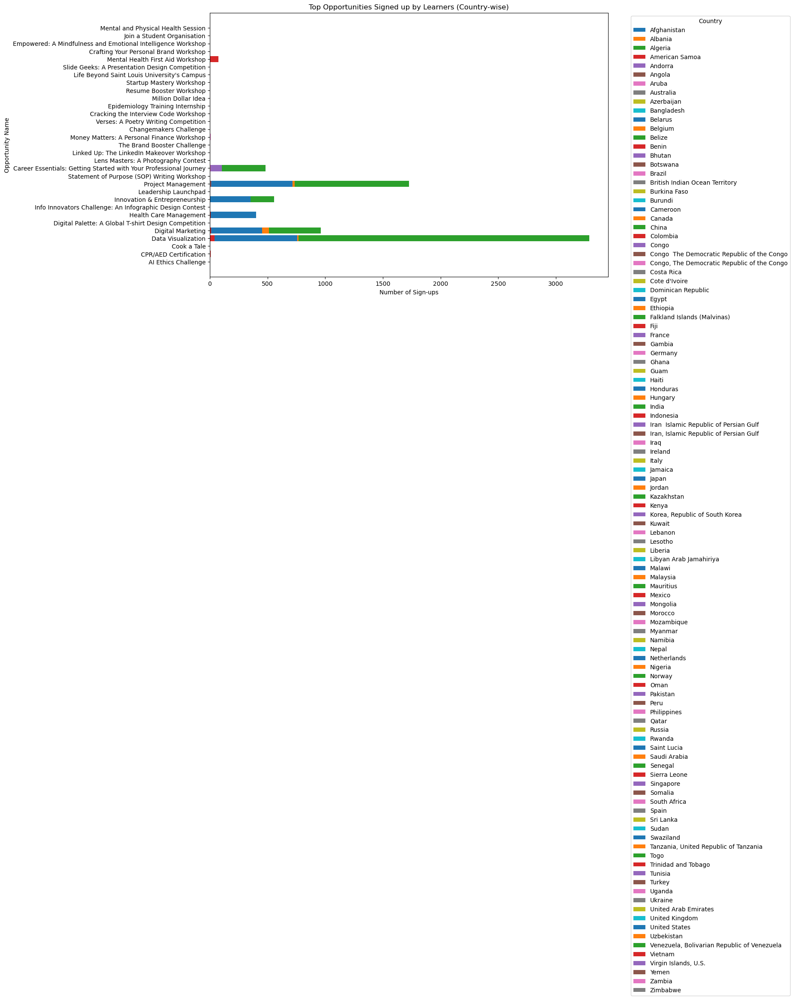

In [66]:
# Popular Opportunity country-wise

# Group data by 'Country' and 'Opportunity Name', then count the occurrences
popular_opportunities = opportunity_data.groupby(['Country', 'Opportunity Name']).size().reset_index(name='Sign-ups')

# Sort the values by 'Sign-ups' in descending order within each country
popular_opportunities['Rank'] = popular_opportunities.groupby('Country')['Sign-ups'].rank(method='dense', ascending=False)
popular_opportunities = popular_opportunities[popular_opportunities['Rank'] <= 5]  # Consider top 5 opportunities per country

# Plotting a bar chart for top opportunities signed up by learners in each country
plt.figure(figsize=(12, 8))
for country, data in popular_opportunities.groupby('Country'):
    plt.barh(data['Opportunity Name'], data['Sign-ups'], label=country)

plt.xlabel('Number of Sign-ups')
plt.ylabel('Opportunity Name')
plt.title('Top Opportunities Signed up by Learners (Country-wise)')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [67]:
# Analyzing top 5 countries based on Oppotunity Completion

# Filter data for completed opportunities (assuming 'Opportunity End Date' indicates completion)
completed_opportunities = opportunity_data.dropna(subset=['Opportunity End Year'])

# Group data by 'Country' and 'Opportunity Name', then count the occurrences
popular_completed = completed_opportunities.groupby(['Country', 'Opportunity Name']).size().reset_index(name='Completed')

# Sort the values by 'Completed' in descending order within each country
popular_completed['Rank'] = popular_completed.groupby('Country')['Completed'].rank(method='dense', ascending=False)
popular_completed = popular_completed[popular_completed['Rank'] <= 5]  # Consider top 5 completed opportunities per country

# Calculate top 5 countries with the most completed opportunities
top_5_countries = popular_completed.groupby('Country')['Completed'].sum().nlargest(5).index

# Display the top completed opportunities by learners in each of the top 5 countries as a table
for country in top_5_countries:
    country_data = popular_completed[popular_completed['Country'] == country]
    print(f"Top completed opportunities in {country}:")
    display(country_data[['Opportunity Name', 'Completed']].head())
    print()


Top completed opportunities in India:


,Opportunity Name,Completed
241,Career Essentials: Getting Started with Your P...,482
246,Data Visualization,3288
247,Digital Marketing,961
253,Innovation & Entrepreneurship,558
264,Project Management,1727



Top completed opportunities in United States:


,Opportunity Name,Completed
668,Data Visualization,756
669,Digital Marketing,453
673,Health Care Management,402
675,Innovation & Entrepreneurship,352
686,Project Management,718



Top completed opportunities in Nigeria:


,Opportunity Name,Completed
432,Data Visualization,768
433,Digital Marketing,512
437,Health Care Management,344
439,Innovation & Entrepreneurship,154
447,Project Management,736



Top completed opportunities in Pakistan:


,Opportunity Name,Completed
457,Career Essentials: Getting Started with Your P...,104
462,Data Visualization,212
463,Digital Marketing,156
467,Health Care Management,53
478,Project Management,231



Top completed opportunities in Ghana:


,Opportunity Name,Completed
203,Career Essentials: Getting Started with Your P...,59
208,Data Visualization,190
209,Digital Marketing,104
213,Health Care Management,122
224,Project Management,157


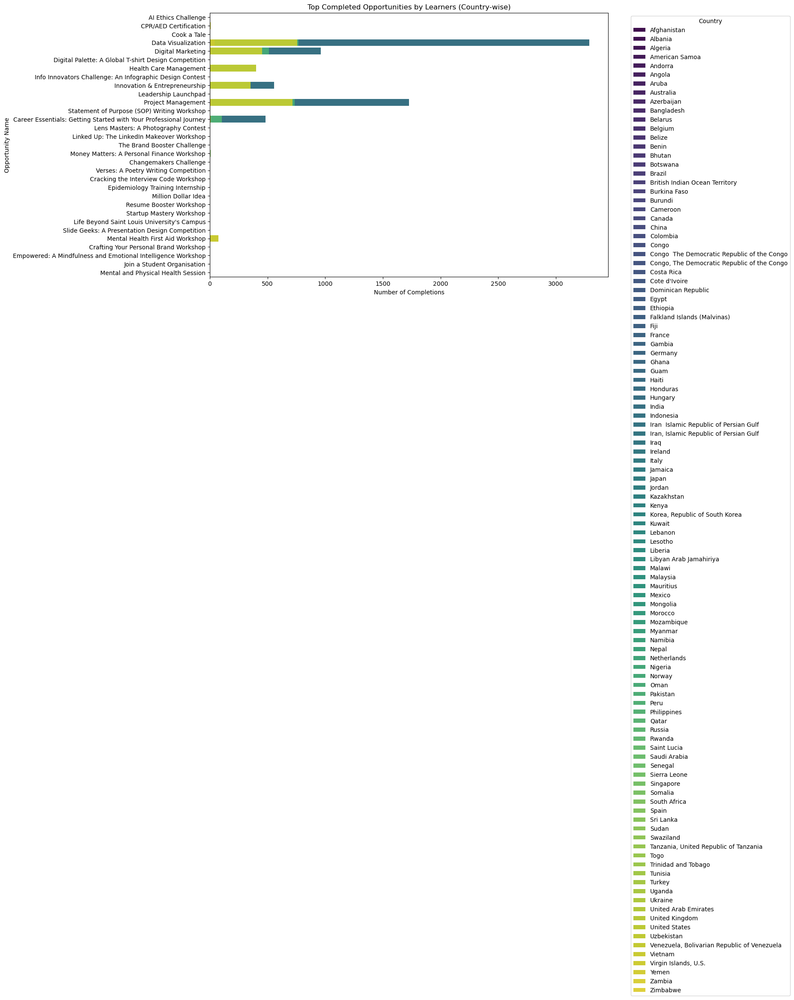

In [ ]:
# Analyzing Country Vs Opportunity w.r.t Opportunity completion

# Filter data for completed opportunities (assuming 'Opportunity End Date' indicates completion)
completed_opportunities = opportunity_data.dropna(subset=['Opportunity End Year'])

# Group data by 'Country' and 'Opportunity Name', then count the occurrences
popular_completed = completed_opportunities.groupby(['Country', 'Opportunity Name']).size().reset_index(name='Completed')

# Sort the values by 'Completed' in descending order within each country
popular_completed['Rank'] = popular_completed.groupby('Country')['Completed'].rank(method='dense', ascending=False)
popular_completed = popular_completed[popular_completed['Rank'] <= 5]  # Consider top 5 completed opportunities per country

# Create a bar plot using Seaborn for top completed opportunities by learners in each country
plt.figure(figsize=(12, 8))
sns.barplot(data=popular_completed, x='Completed', y='Opportunity Name', hue='Country', dodge=False, palette='viridis')
plt.xlabel('Number of Completions')
plt.ylabel('Opportunity Name')
plt.title('Top Completed Opportunities by Learners (Country-wise)')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


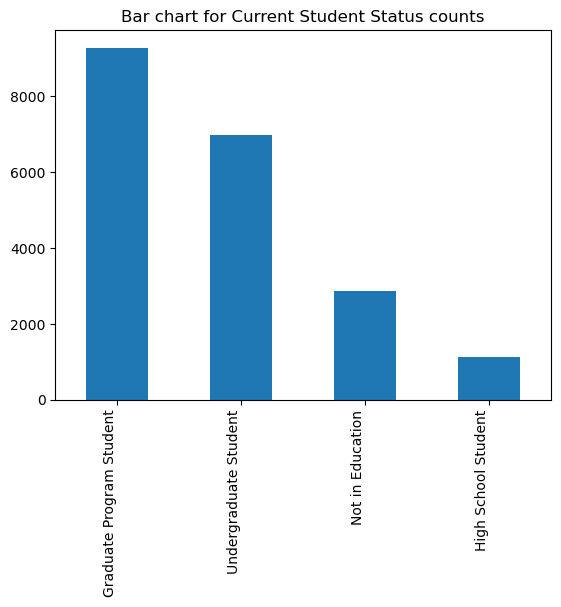

KeyboardInterrupt: 

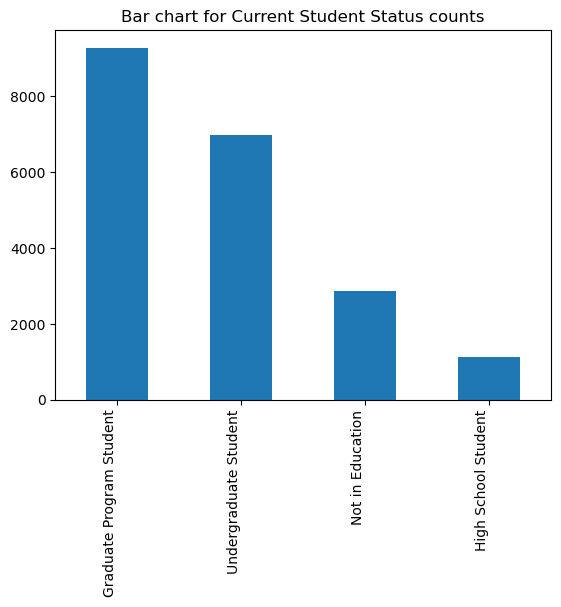

In [69]:
#Bar chart for Current Student Status counts
css=opportunity_data['Current Student Status'].value_counts()
css.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Current Student Status'].name + " counts" )
plt.show()

The majority of learners who actively participated on the Excelerate website are enrolled in graduate programs, with undergraduate students, individuals not currently in education, and high school students following suit.

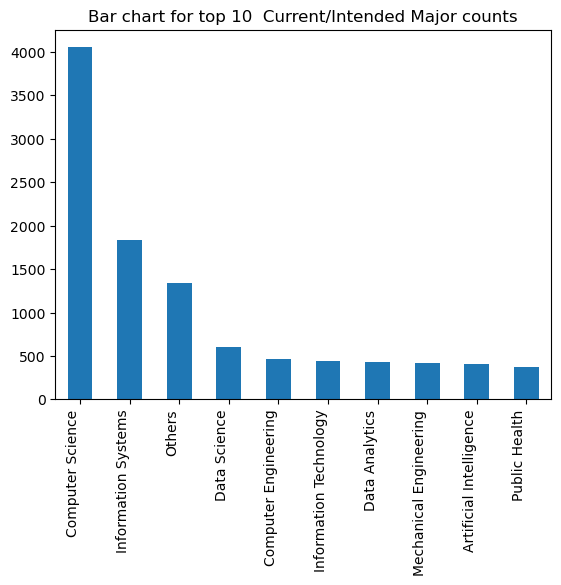

In [70]:
#Bar chart for 'Current/Intended Major' counts
css_top10=opportunity_data['Current/Intended Major'].value_counts().iloc[:10]
css_top10.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for top 10  Current/Intended Major counts" )
plt.show()

Computer Science stands out as the primary field from which the majority of learners either graduated or plan to pursue as their intended major, with Information Systems following closely.

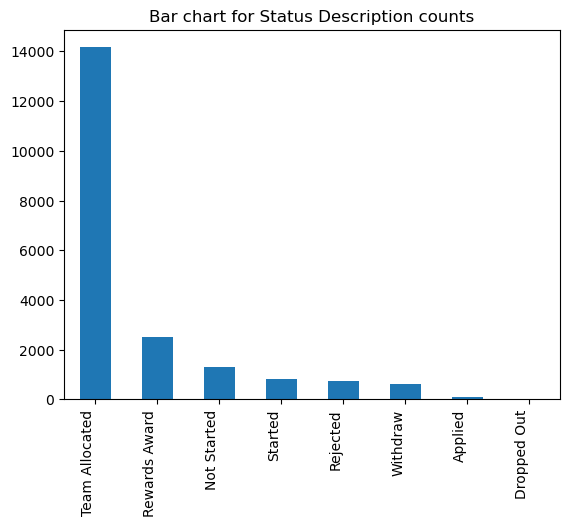

In [71]:

#Bar chart for 'Status Description' counts
sd=opportunity_data['Status Description'].value_counts()
sd.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Status Description'].name + " counts" )
plt.show()

In the status of learners, the majority of those who actively participated had their teams allocated.

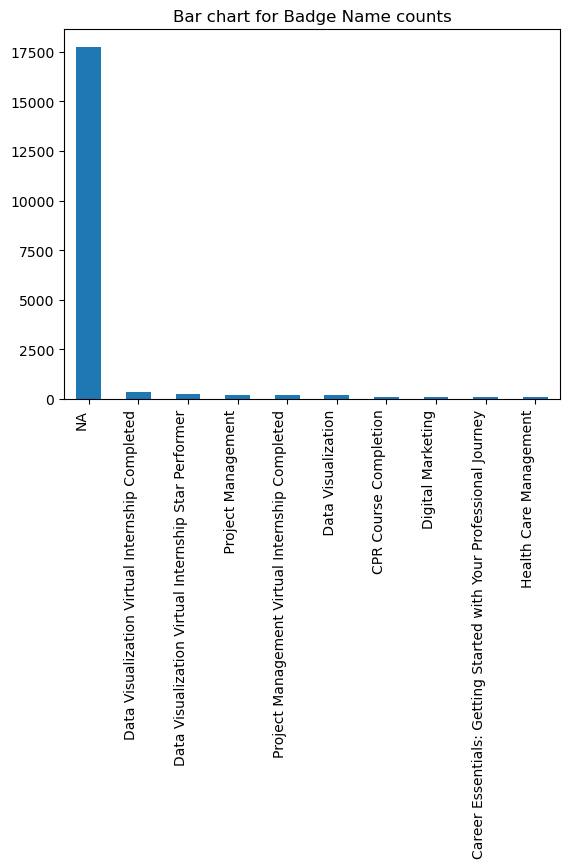

In [72]:
#Bar chart for 'Badge Name' counts
bn=opportunity_data['Badge Name'].value_counts().iloc[:10]
bn.plot(kind='bar')
plt.xticks(rotation = 90, horizontalalignment='right')
plt.title("Bar chart for " + opportunity_data['Badge Name'].name + " counts" )
plt.show()

Similar to the observed pattern in the acquisition of skills, the majority of students did not earn any badges. Only a small percentage achieved this recognition.

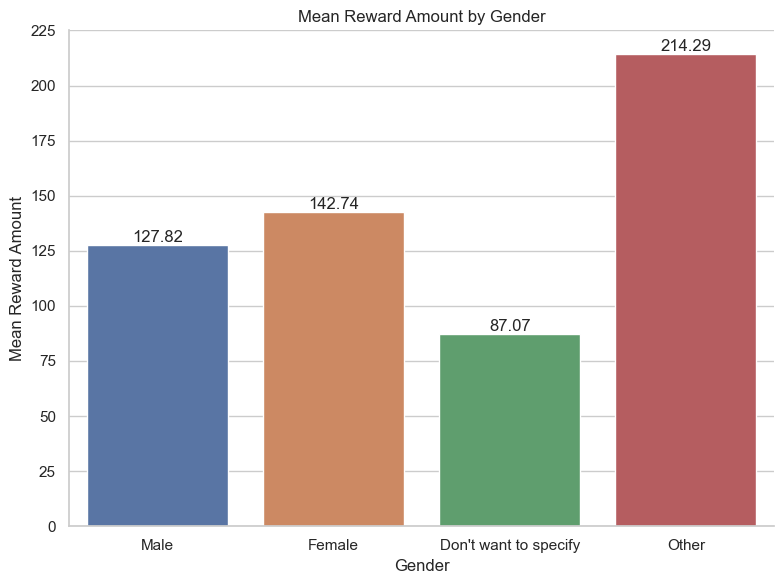

In [73]:
# Set style using Seaborn
sns.set(style='whitegrid')  # Choose a style ('whitegrid', 'darkgrid', 'white', 'dark', etc.)

# Create the bar plot for mean reward amount grouped by gender
plt.figure(figsize=(8, 6))  # Set the figure size
ax = sns.barplot(x='Gender', y='Reward Amount', data=opportunity_data, estimator='mean', ci=None)  # Use estimator='mean' to show mean values
plt.xlabel('Gender')
plt.ylabel('Mean Reward Amount')
plt.title('Mean Reward Amount by Gender')

# Enhance aesthetics
sns.despine()  # Remove the top and right spines from plot
for bar in ax.patches:  # Add data labels on the bars
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()

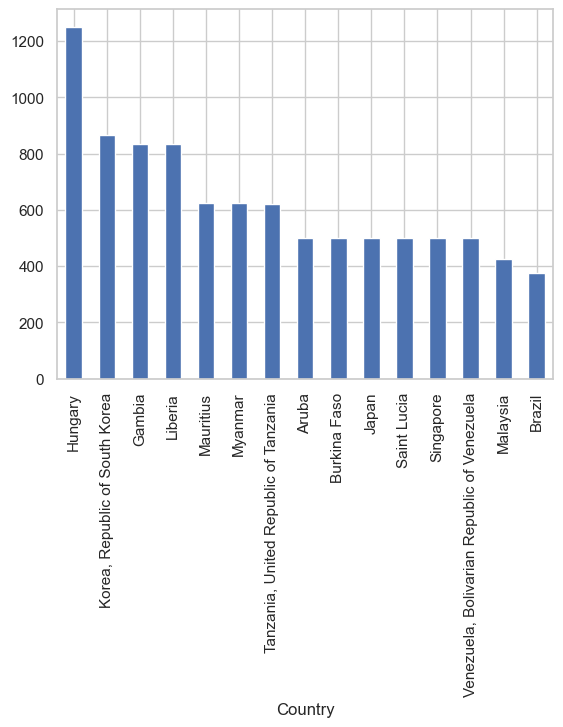

In [74]:
##Plot a bar plot 
opportunity_data.groupby(["Country"])["Reward Amount"].mean().nlargest(15).plot(kind='bar')
plt.show()

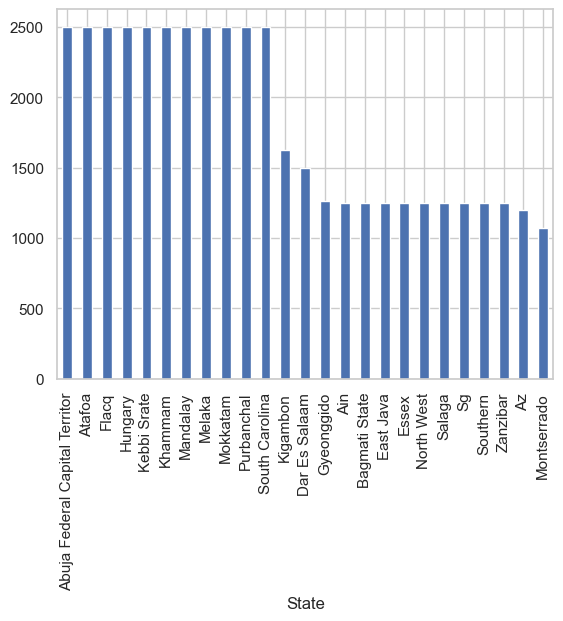

In [75]:
##Plot a bar plot 
opportunity_data.groupby(["State"])["Reward Amount"].mean().nlargest(25).plot(kind='bar')
plt.show()

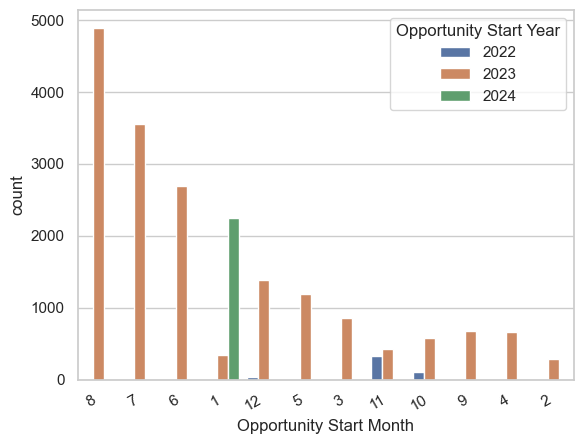

In [78]:
# monthwise Start  
sns.countplot(x = "Opportunity Start Month", data = opportunity_data, hue = "Opportunity Start Year", order = opportunity_data['Opportunity Start Month'].value_counts().index)
plt.xticks(rotation = 30, horizontalalignment='right')
plt.show()

In [80]:
# Assuming 'opportunity_data' is your DataFrame and 'Skill1' through 'Skill6' are the skill columns
skill_columns = ["Creative Thinking","Technology Literacy","Communication","Career Readiness","Initiative","Media Literacy",
                 "Leadership","Information Literacy","Collaboration","Flexibility","Productivity","Social Skills","College Readiness"]

# Creating a DataFrame with just the skill columns
skills_df = opportunity_data[skill_columns]

# Counting the occurrences of each skill
skill_counts = skills_df.apply(pd.Series.value_counts).fillna(0)
print("Skill Occurrences:")
print(skill_counts)


Skill Occurrences:
   Creative Thinking  Technology Literacy  Communication  Career Readiness  \
0              18071                18083          17922             20229   
1               2187                 2175           2336                29   

   Initiative  Media Literacy  Leadership  Information Literacy  \
0       19899           20233       19943                 18749   
1         359              25         315                  1509   

   Collaboration  Flexibility  Productivity  Social Skills  College Readiness  
0          18182        19518         20222          20237              20244  
1           2076          740            36             21                 14  


In [76]:
# Assuming 'skill_counts' contains the count of occurrences of each skill

# Transpose the DataFrame for better visualization
skill_counts_transposed = skill_counts.T

# Calculate the total count of occurrences for each skill
total_counts = skill_counts_transposed.sum(axis=1)

# Calculate the percentage of occurrences for each skill
skill_percentages = (skill_counts_transposed[1] / total_counts) * 100

print("Skill Occurrence Percentages:")
print(skill_percentages)


NameError: name 'skill_counts' is not defined

In [77]:
import matplotlib.pyplot as plt

# Assuming 'skill_percentages' contains the percentage of occurrence for each skill

# Sort the skill percentages in descending order for better visualization
sorted_percentages = skill_percentages.sort_values(ascending=True)

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 8))
plt.barh(sorted_percentages.index, sorted_percentages.values, color='orange')

# Set labels, title, and ticks
plt.xlabel('Percentage of Occurrence')
plt.ylabel('Skills')
plt.title('Percentage of Skill Occurrences')
plt.grid(axis='x')  # Show gridlines only on the x-axis

# Show the plot
plt.tight_layout()
plt.show()


NameError: name 'skill_percentages' is not defined

### Creating Dummy Variables

Creating the Dummy variables
We need to convert the categorical variable to numeric. 

1.Create the dummy variable 2.Drop the original variable 3.Drop one dummy variable for each dummy variable (n-1)

In [78]:
opportunity_data.head()

,Profile Id,Opportunity Name,Opportunity Category,Gender,City,State,Country,Current Student Status,Current/Intended Major,Status Description,Reward Amount,Badge Name,Skill Points Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness,Apply Year,Apply Month,Opportunity Start Year,Opportunity Start Month,Opportunity End Year,Opportunity End Month,Graduation Year,Graduation Month,Apply Hour,Age
0,31ce84c2-2bd1-40ba-b2d8-f164fe125306,Statement of Purpose (SOP) Writing Workshop,Event,Male,Dhaka,Savar,Bangladesh,High School Student,Data Science,Not Started,0,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2022,10,2023,1,2023,2,2023,6,17.0,21
1,36814990-f854-4f76-8c63-91f27567d080,Statement of Purpose (SOP) Writing Workshop,Event,Female,Amritsar,Punjab,Afghanistan,Undergraduate Student,Others,Rewards Award,200,Statement of Purpose (SOP) Writing Workshop,10,1,0,1,1,0,0,0,0,0,0,0,0,0,2023,1,2023,1,2023,2,2021,1,18.0,23
2,8154328c-f8fe-4bd1-af05-783e140f68b5,Statement of Purpose (SOP) Writing Workshop,Event,Female,Satna,Madhya Pradesh,India,High School Student,Computer Science,Not Started,0,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2022,10,2023,1,2023,2,2023,4,8.0,21
3,a83abad6-db1e-44c4-a8f4-9e397e282d73,Statement of Purpose (SOP) Writing Workshop,Event,Male,Hyderabad,Telangana,India,Graduate Program Student,Computer Science,Not Started,0,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2022,10,2023,1,2023,2,2024,12,13.0,20
4,c2b8a15f-2ba3-41e4-a553-7ca68b0d4a54,Statement of Purpose (SOP) Writing Workshop,Event,Male,Bangalore,Karnataka,India,Undergraduate Student,Others,Not Started,0,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2022,10,2023,1,2023,2,2022,6,11.0,22


In [79]:
opportunity_data = pd.get_dummies(opportunity_data, drop_first=True)
opportunity_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20258 entries, 0 to 20257
Columns: 15990 entries, Reward Amount to Badge Name_Statement of Purpose (SOP) Writing Workshop
dtypes: float64(1), int64(24), uint8(15965)
memory usage: 312.3 MB


In [80]:
opportunity_data.head(3)

,Reward Amount,Skill Points Earned,Creative Thinking,Technology Literacy,Communication,Career Readiness,Initiative,Media Literacy,Leadership,Information Literacy,Collaboration,Flexibility,Productivity,Social Skills,College Readiness,Apply Year,Apply Month,Opportunity Start Year,Opportunity Start Month,Opportunity End Year,Opportunity End Month,Graduation Year,Graduation Month,Apply Hour,Age,Profile Id_001c3520-ef36-4e4c-b543-513477ff1ef3,Profile Id_002a7d71-e532-4bdf-8779-bc98a7925792,Profile Id_002c6227-035d-4fee-a485-cb51029a3c5b,Profile Id_0031b92e-5c72-4e08-8f2f-a74be42138f1,Profile Id_003e3965-d62b-4827-9675-1eac49a6387e,Profile Id_0049929a-793d-4e3a-904e-43447bb62817,Profile Id_004b8a25-17d4-4e9a-a41b-b5336327e170,Profile Id_00628747-9775-4a85-a179-4d5007ccb8b7,Profile Id_006d0ed6-ed3c-44e6-bee4-96ac9a0374f1,Profile Id_00728a84-55c8-47cb-9424-b14f08ba7cd7,Profile Id_0078ce24-2d05-4cab-a908-09f705894fad,Profile Id_0079144d-f9ed-4501-a737-2b2b5c71616c,Profile Id_007a038a-7c64-4fab-8241-093406e6f7e6,Profile Id_007cd662-28f8-46b2-91d9-f7844168b4a7,Profile Id_00841155-6c62-4f83-b165-57ba0df9c031,Profile Id_008d5af8-d773-451c-802e-e60376ceb2ee,Profile Id_00988c71-4e52-42d3-93a3-2db49de96750,Profile Id_00a112b7-f50b-42e6-82df-94740c7e1daa,Profile Id_00afc691-350b-4591-8ba7-6277a0b8613f,Profile Id_00b57570-44f2-4168-a191-b5f36f721d8f,Profile Id_00b6ec36-f864-4016-a07e-959c35d19ead,Profile Id_00bc679a-b0ae-4344-89fe-6b2221cae7c8,Profile Id_00ca4a4f-4166-44c4-9b5b-293fee58f40a,Profile Id_00d39ce2-00da-4d74-881f-69b565335350,Profile Id_00d3b0a8-dbe3-4ede-9002-14a4e8110c19,Profile Id_00d705cc-c90f-4e1c-842c-7dcd8f2ce515,Profile Id_00d7d242-eee7-478f-9a64-1393bc6a8ebc,Profile Id_00da6828-819d-4772-bc50-b9ac5908e9be,Profile Id_00f5161c-ba85-472d-9b0a-3301aac78598,Profile Id_00fa67b4-6d33-4d6c-917d-2022309a2a01,Profile Id_00fbd012-4921-43b5-b940-63ac20b56ca1,Profile Id_01016f8b-e17a-4b7f-b993-f0077e9053b1,Profile Id_010bccba-3e4a-4555-8849-991e2296186d,Profile Id_01118833-71f8-4304-a5eb-afd8c67e4874,Profile Id_01147fa0-d911-4841-8a34-3ac8635aa9fe,Profile Id_011565fe-a343-460d-ba42-1f8888baaa39,Profile Id_01273a5e-fcc5-4b1a-a637-19aff497dac1,Profile Id_012c6d1c-6193-4a3f-acc2-831441b0bc44,Profile Id_0132cec8-85d3-46a8-a56a-c419ea355ed2,Profile Id_013c0088-54a0-4e27-8255-03087f7ac567,Profile Id_013d1680-3678-489b-a1d6-ffd5bb40bc9d,Profile Id_013ed5a7-c435-4950-baf2-338aa949e7b0,Profile Id_01433d91-94fd-468e-9d15-75599ad26ff4,Profile Id_014acbc8-41e4-4d5b-8ed5-e4cc6d81851a,Profile Id_014c1987-7bbd-4c65-9033-5cdd8cc05447,Profile Id_015567f3-fa2b-4068-bbbc-0d6cda02194a,Profile Id_01593578-2d5b-4d1d-8dd8-71cc6cd76da4,Profile Id_01593fbd-baa7-4dee-8fd2-92c2c8268d67,Profile Id_015aa2b2-dcbb-46ea-8c11-e39e2ece0d03,Profile Id_0163d674-2316-4964-9374-72862ba986d7,Profile Id_016722c6-6460-4da2-abe9-1d466dfebd5f,Profile Id_01724978-3678-4ac7-8e9e-b2171cfda107,Profile Id_0173c7fb-3eaf-4fda-9ced-78aa5a2c980b,Profile Id_017d0466-0abf-4899-928c-694f39cf93e4,Profile Id_017e6696-4b25-4fa2-8674-d0fba427f35c,Profile Id_0180d531-9c6e-48c7-ba94-f6e167487cfe,Profile Id_0181558c-6667-4957-b845-9e6d6bf216db,Profile Id_0184651c-cee5-4481-a3a0-a76c4cb47bc3,Profile Id_018cc699-95d8-4880-b7b1-53aa6cbfac17,Profile Id_018f8572-b986-49cf-99e1-8f1639af6db8,Profile Id_0194f219-ef77-433f-87a4-29d67095b671,Profile Id_019c7a24-b72f-490c-ae28-ee3bf85eab4d,Profile Id_01bbefee-380c-4f6b-95f3-bfc22ecfad0a,Profile Id_01c2a6ce-116b-4f8d-ba51-4c602b1008f6,Profile Id_01c2a8b1-b475-411a-8af1-54dfff666cfa,Profile Id_01c39c2b-3dab-4ca7-9b88-4e5c18bf5abe,Profile Id_01c62595-2c3b-48f8-86f2-b07747d27fe2,Profile Id_01c6d465-0471-438b-b468-6d4447528041,Profile Id_01c77126-eb8a-4c60-9d6a-2df3aa5590be,Profile Id_01ca6306-aa78-4a5a-9634-d546723751a7,Profile Id_01d33d5f-2bfc-4be3-bd5a-41134be1724c,Profile Id_01d4090b-fc64-4ac1-99a6-4c2a2cd1eb92,Profile Id_01d62b29-a150-485b-8c1e-d6778a1de716,Profile Id_01dcf60b-ac2d-4a80-8da0-18a777e26553,Profile Id_01df8af1-39b1-47a1-ae11-9c08454f2cb7,Profil